**Instructions:**
For the first time **Test set results calculation** needs to be executed, but afterwards the **Test set results reusage** can be used to simply load evaluation results and perform analysis

# Init

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%config InlineBackend.figure_format = 'retina'

In [ ]:
%env DRIVE_DATA_DIR=./gdrive/MyDrive/master-thesis
%env COLAB_DATA_DIR=data

env: DRIVE_DATA_DIR=./gdrive/MyDrive/master-thesis
env: COLAB_DATA_DIR=data


In [ ]:
# https://stackoverflow.com/questions/69433024/error-message-with-sklearn-function-roccurvedisplay-has-no-attribute-from-p
! pip install --upgrade scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 14.1 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [ ]:
import os

# External libraries
import pickle
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import concat, argmax
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import (
    accuracy_score, multilabel_confusion_matrix, confusion_matrix,
    auc, roc_curve, ConfusionMatrixDisplay, RocCurveDisplay,
    roc_auc_score, precision_score, recall_score, f1_score,
    PrecisionRecallDisplay, average_precision_score,
    precision_recall_curve, precision_recall_fscore_support
)
from sklearn.preprocessing import LabelBinarizer
from sklearn import datasets
from sklearn.manifold import TSNE
from collections import Counter
from itertools import cycle

# Keras and related imports
import keras
from keras import layers
from keras.models import Model
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

In [ ]:
def loadTestResuls(model_name,dataset_name,image_size):
  filename=f"{os.environ['DRIVE_DATA_DIR']}/test_results/{model_name}-{dataset_name}-{os.environ['IMAGE_FORMAT']}-{image_size[0]}x{image_size[1]}-{batch_size}-{phase1optimizer}+{phase2optimizer}-70:15:15-test_results.pkl"

  with open(filename, 'rb') as file:
    test_results = pickle.load(file)

  return test_results

# Configuration

## Static configuration

In [ ]:
%env IMAGE_FORMAT=png

env: IMAGE_FORMAT=png


In [ ]:
phase1optimizer="RMSprop"
phase2optimizer="RMSprop"

In [ ]:
batch_size = 32 # (TSAI VGG19)

In [ ]:
seed=123

## Model selection

In [ ]:
model_name = "VGG19"

In [ ]:
model_name = "MobileNetV2"

In [ ]:
model_name = "EfficientNetV2B0"

## Dataset selection

### Kather16

In [ ]:
%env DATASET=Kather_texture_2016_image_tiles_5000

env: DATASET=Kather_texture_2016_image_tiles_5000


In [ ]:
image_size=(150, 150)

### Kather16 NORMALIZED

In [ ]:
%env DATASET=Kather_texture_2016_image_tiles_5000_NORM

env: DATASET=Kather_texture_2016_image_tiles_5000_NORM


In [ ]:
image_size=(150, 150)

### Kather19

In [ ]:
%env DATASET=NCT-CRC-HE-100K

env: DATASET=NCT-CRC-HE-100K


In [ ]:
image_size=(224, 224)

### Merged datasets - k16 NONORM

In [ ]:
%env DATASET=merged_datasets_k16-NONORM

env: DATASET=merged_datasets_k16-NONORM


In [ ]:
image_size=(100, 100)

### Merged datasets - k16 NORM

In [ ]:
%env DATASET=merged_datasets_k16-NORM

env: DATASET=merged_datasets_k16-NORM


In [ ]:
image_size=(100, 100)

# Load training metrics

In [ ]:
# Open the file in binary mode
with open(f"{os.environ['DRIVE_DATA_DIR']}/training_results/{os.environ['DATASET']}/{model_name}-{os.environ['DATASET']}-{os.environ['IMAGE_FORMAT']}-{image_size[0]}x{image_size[1]}-{batch_size}-{phase1optimizer}+{phase2optimizer}-70:15:15.pkl", 'rb') as file:

    # Call load method to deserialze
    metrics, seed = pickle.load(file)

# **Test set results reusage**

Uncomment to load kather 7k test

In [ ]:
# %env DATASET=CRC-VAL-HE-7K

In [ ]:
test_results = loadTestResuls(model_name, os.environ['DATASET'],image_size)

true_categories = test_results["true_categories"]
y_pred = test_results["y_pred"]
predicted_categories = test_results["predicted_categories"]
features = test_results["features"]
y_onehot_test = test_results["y_onehot_test"]
class_names = test_results["class_names"]

# Test set results calculation

## Load model

In [ ]:
model = keras.models.load_model(f"{os.environ['DRIVE_DATA_DIR']}/training_results/{os.environ['DATASET']}/{model_name}-{os.environ['DATASET']}-{os.environ['IMAGE_FORMAT']}-{image_size[0]}x{image_size[1]}-{batch_size}-{phase1optimizer}+{phase2optimizer}-70:15:15.keras")

## Case 1: Internal test set

### Loading images from drive

In [ ]:
%%shell
rm -rf $COLAB_DATA_DIR
mkdir $COLAB_DATA_DIR
cp $DRIVE_DATA_DIR/$DATASET.${IMAGE_FORMAT}.zip $COLAB_DATA_DIR
unzip $COLAB_DATA_DIR/$DATASET.${IMAGE_FORMAT}.zip -d . && rm $COLAB_DATA_DIR/$DATASET.${IMAGE_FORMAT}.zip

In [ ]:
dataset=os.environ['COLAB_DATA_DIR']+"/"+os.environ['DATASET']+"/"

In [ ]:
train_ds, validation_ds = keras.utils.image_dataset_from_directory(
  dataset,
  labels="inferred",
  label_mode="int",
  # class_names=None,
  color_mode="rgb",
  batch_size=batch_size,
  image_size=image_size,
  shuffle=True,
  seed=seed,
  validation_split=0.3, # 0.4,
  subset="both",
  crop_to_aspect_ratio=False
)

Found 110930 files belonging to 9 classes.
Using 77651 files for training.
Using 33279 files for validation.


In [ ]:
# Save this because after take/skip wont be available, file_paths not part of regular Dataset API
image_file_paths=validation_ds.file_paths

In [ ]:
val_batches = validation_ds.cardinality().numpy()         # 70 %
test_ds = validation_ds.take((1*val_batches) // 2)        # 20 %
validation_ds = validation_ds.skip((1*val_batches) // 2)  # 10 %

# https://www.tensorflow.org/api_docs/python/tf/data/Dataset#cardinality
# https://stackoverflow.com/a/74609848/12108610

# number of files / batch size
print(f"Number of training samples: {train_ds.cardinality().numpy() * batch_size}")
print(f"Number of validation samples: {validation_ds.cardinality().numpy() * batch_size}")
print(f"Number of test samples: {test_ds.cardinality().numpy() * batch_size}")

Number of training samples: 77664
Number of validation samples: 16640
Number of test samples: 16640


In [ ]:
class_names = train_ds.class_names

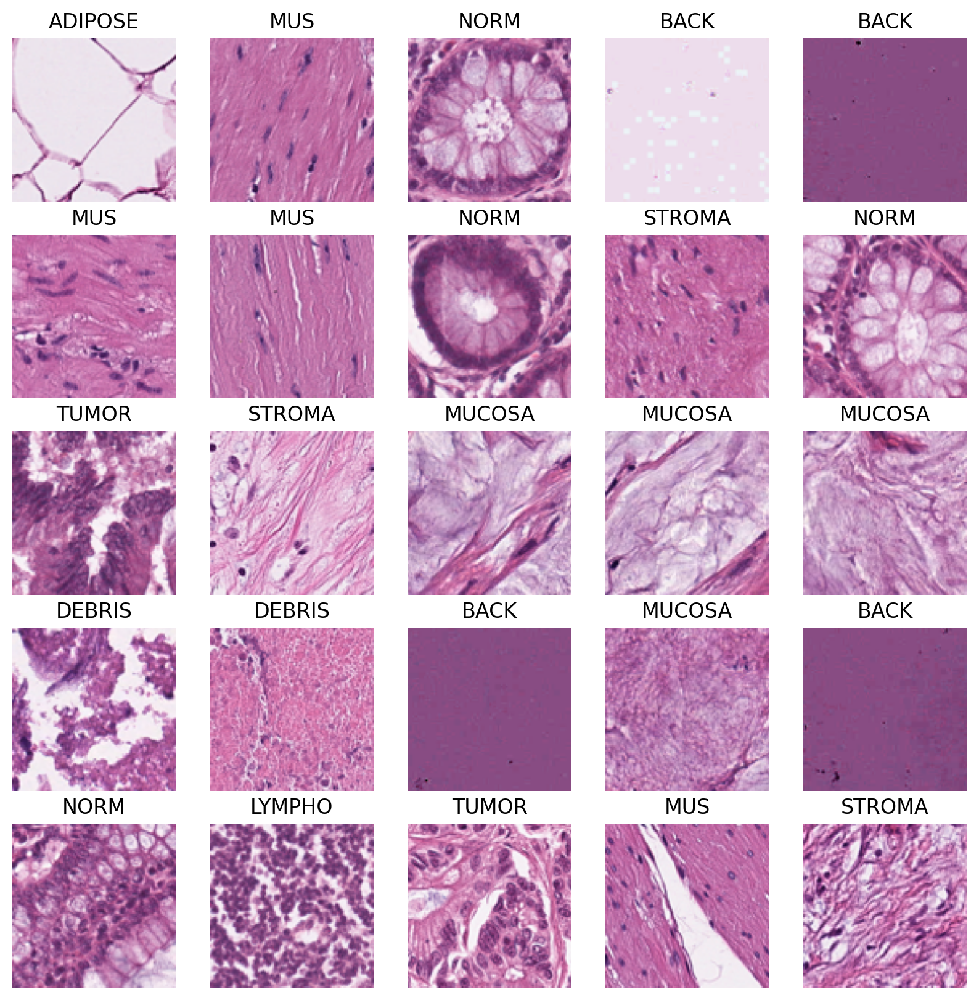

In [ ]:
plt.figure(figsize=(10, 10))

for images, labels in train_ds.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

### Save file paths

In [ ]:
filename=f"{os.environ['DRIVE_DATA_DIR']}/test_results/dataset_file-paths-{os.environ['DATASET']}.pkl"

with open(filename, 'wb') as file:
	pickle.dump(image_file_paths, file)

### Calculation

In [ ]:
true_categories = concat([y for x, y in test_ds], axis=0).numpy()
true_categories.shape

(16640,)

In [ ]:
y_pred = model.predict(test_ds)

520/520 [==============================] - 17s 25ms/step


In [ ]:
y_pred.shape

(16640, 9)

In [ ]:
predicted_categories = argmax(y_pred, axis=1).numpy()
predicted_categories.shape

(16640,)

#### Binarize labels

In [ ]:
true_train_categories = np.concatenate([y for x, y in train_ds], axis=0)
true_train_categories.shape

(77651,)

In [ ]:
label_binarizer = LabelBinarizer().fit(true_train_categories)

In [ ]:
y_onehot_test = label_binarizer.transform(true_categories)
y_onehot_test.shape

(16640, 9)

#### t-SNE features extraction

In [ ]:
# Assume 'model' is the pre-trained Keras model and you want to extract from the 'layer_name' layer
layer_output = model.get_layer('dropout_1').output
feature_extractor = Model(inputs=model.input, outputs=layer_output)
# Now you can use feature_extractor to retrieve the output of 'layer_name'
features = feature_extractor.predict(test_ds)
features.shape

520/520 [==============================] - 22s 29ms/step


(16640, 1280)

### Saving results

In [ ]:
print(f"""
Model name: {model_name}
Dataset: {os.environ['DATASET']}
Image format: {os.environ['IMAGE_FORMAT']}
Image dimensions: {image_size[0]}x{image_size[1]}
Batch size: {batch_size}
Phase 1 optimizer: {phase1optimizer}
Phase 2 optimizer: {phase2optimizer}
      """)


Model name: EfficientNetV2B0
Dataset: merged_datasets_k16-NORM
Image format: png
Image dimensions: 100x100
Batch size: 32
Phase 1 optimizer: RMSprop
Phase 2 optimizer: RMSprop
      


In [ ]:
test_results = {
    "true_categories": true_categories,
    "y_pred": y_pred,
    "predicted_categories": predicted_categories,
    "features": features,
    "y_onehot_test": y_onehot_test,
    "class_names": class_names
}

filename=f"{os.environ['DRIVE_DATA_DIR']}/test_results/{model_name}-{os.environ['DATASET']}-{os.environ['IMAGE_FORMAT']}-{image_size[0]}x{image_size[1]}-{batch_size}-{phase1optimizer}+{phase2optimizer}-70:15:15-test_results.pkl"

with open(filename, 'wb') as file:
	pickle.dump(test_results, file)

## Case 2: External test set (Kather19 with 7k images)

### Loading images from drive - external Kather19 test dataset

In [ ]:
%env EXTERNAL_TEST_DATASET=CRC-VAL-HE-7K

env: EXTERNAL_TEST_DATASET=CRC-VAL-HE-7K


In [ ]:
%%shell
rm -rf $COLAB_DATA_DIR
mkdir $COLAB_DATA_DIR
cp $DRIVE_DATA_DIR/$EXTERNAL_TEST_DATASET.${IMAGE_FORMAT}.zip $COLAB_DATA_DIR
unzip $COLAB_DATA_DIR/$EXTERNAL_TEST_DATASET.${IMAGE_FORMAT}.zip -d . && rm $COLAB_DATA_DIR/$EXTERNAL_TEST_DATASET.${IMAGE_FORMAT}.zip

In [ ]:
train_ds, val_ds = keras.utils.image_dataset_from_directory(
  os.environ['COLAB_DATA_DIR']+"/"+os.environ['EXTERNAL_TEST_DATASET']+"/",
  labels="inferred",
  label_mode="int",
  # class_names=None,
  color_mode="rgb",
  batch_size=batch_size,
  image_size=image_size,
  shuffle=True,
  seed=seed,
  validation_split=0.9999, # 0.4,
  subset="both",
  crop_to_aspect_ratio=False
)

Found 7180 files belonging to 9 classes.
Using 36 files for training.
Using 7144 files for validation.


In [ ]:
test_ds = train_ds.concatenate(val_ds)

In [ ]:
class_names = train_ds.class_names

In [ ]:
print(f"Number of test samples: {test_ds.cardinality().numpy() * batch_size}")

Number of test samples: 7232


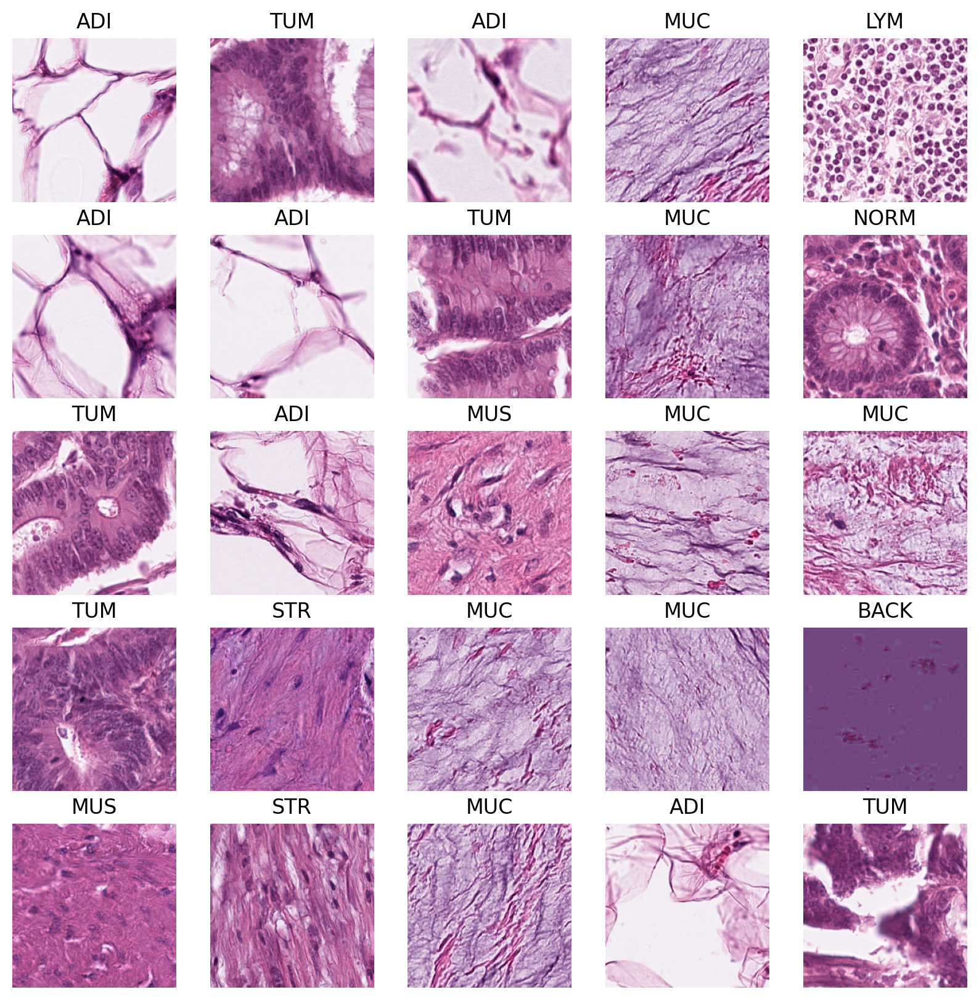

In [ ]:
plt.figure(figsize=(10, 10))

for images, labels in test_ds.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

### Testing images

In [ ]:
true_categories = concat([y for x, y in test_ds], axis=0).numpy()
true_categories.shape

(36,)

In [ ]:
y_pred = model.predict(test_ds)

12/12 [==============================] - 26s 2s/step


In [ ]:
predicted_categories = argmax(y_pred, axis=1).numpy()
predicted_categories.shape

(36,)

In [ ]:
accuracy = accuracy_score(true_categories, predicted_categories)
precision_micro = precision_score(true_categories, predicted_categories, average='macro')
recall_micro = recall_score(true_categories, predicted_categories, average='macro')
f1_micro = f1_score(true_categories, predicted_categories, average='macro')

micro_roc_auc_ovr = roc_auc_score(true_categories, y_pred, multi_class="ovr", average="macro")


pd.DataFrame({
    'Accuracy': [f"{accuracy:.4f}"],
    'Precision': [f"{precision_micro:.4f}"],
    'Recall': [f"{recall_micro:.4f}"],
    'F1 Score': [f"{f1_micro:.4f}"],
    'ROC AUC': [f"{micro_roc_auc_ovr:.4f}"],
})

,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,0.1667,0.1146,0.1104,0.1124,0.4688


#### Binarize labels

In [ ]:
true_test_ds_categories = np.concatenate([y for x, y in test_ds], axis=0)
true_test_ds_categories.shape

(7180,)

In [ ]:
label_binarizer = LabelBinarizer().fit(true_test_ds_categories)

In [ ]:
y_onehot_test = label_binarizer.transform(true_categories)
y_onehot_test.shape

(7180, 9)

#### t-SNE features extraction

In [ ]:
# Assume 'model' is the pre-trained Keras model and you want to extract from the 'layer_name' layer
layer_output = model.get_layer('dropout').output
feature_extractor = Model(inputs=model.input, outputs=layer_output)
# Now you can use feature_extractor to retrieve the output of 'layer_name'
features = feature_extractor.predict(test_ds)
features.shape

226/226 [==============================] - 17s 72ms/step


(7180, 1280)

### Saving results

In [ ]:
print(f"""
Model name: {model_name}
Dataset: {os.environ['DATASET']}
Image format: {os.environ['IMAGE_FORMAT']}
Image dimensions: {image_size[0]}x{image_size[1]}
Batch size: {batch_size}
Phase 1 optimizer: {phase1optimizer}
Phase 2 optimizer: {phase2optimizer}
      """)


Model name: MobileNetV2
Dataset: CRC-VAL-HE-7K
Image format: png
Image dimensions: 224x224
Batch size: 32
Phase 1 optimizer: RMSprop
Phase 2 optimizer: RMSprop
      


In [ ]:
test_results = {
    "true_categories": true_categories,
    "y_pred": y_pred,
    "predicted_categories": predicted_categories,
    "features": features,
    "y_onehot_test": y_onehot_test,
    "class_names": class_names
}

filename=f"{os.environ['DRIVE_DATA_DIR']}/test_results/{model_name}-{os.environ['DATASET']}-{os.environ['EXTERNAL_TEST_DATASET']}-{os.environ['IMAGE_FORMAT']}-{image_size[0]}x{image_size[1]}-{batch_size}-{phase1optimizer}+{phase2optimizer}-70:15:15-test_results.pkl"

with open(filename, 'wb') as file:
	pickle.dump(test_results, file)

### ERROR

#### Case 1

In [ ]:
test_ds_1 = keras.utils.image_dataset_from_directory(
  os.environ['COLAB_DATA_DIR']+"/"+os.environ['EXTERNAL_TEST_DATASET']+"/",
  labels="inferred",
  label_mode="int",
  # class_names=None,
  color_mode="rgb",
  batch_size=batch_size,
  image_size=image_size,
  shuffle=True,
  seed=seed,
  crop_to_aspect_ratio=False
)

Found 7180 files belonging to 9 classes.


In [ ]:
test_ds_1 = test_ds_1.take(5)  # 10 %

In [ ]:
model.evaluate(test_ds_1) # daje tocan accuracy u oba slucaja

5/5 [==============================] - 16s 3s/step - loss: 0.4011 - accuracy: 0.9375


[0.4011436998844147, 0.9375]

In [ ]:
true_categories_1 = concat([y for x, y in test_ds_1], axis=0).numpy()
true_categories_1.shape

(160,)

In [ ]:
y_pred_1 = model.predict(test_ds_1)

5/5 [==============================] - 13s 3s/step


In [ ]:
predicted_categories_1 = argmax(y_pred_1, axis=1).numpy()
predicted_categories_1.shape

(160,)

In [ ]:
accuracy = accuracy_score(true_categories_1, predicted_categories_1)
precision_micro = precision_score(true_categories_1, predicted_categories_1, average='macro')
recall_micro = recall_score(true_categories_1, predicted_categories_1, average='macro')
f1_micro = f1_score(true_categories_1, predicted_categories_1, average='macro')

micro_roc_auc_ovr = roc_auc_score(true_categories_1, y_pred_1, multi_class="ovr", average="macro")


pd.DataFrame({
    'Accuracy': [f"{accuracy:.4f}"],
    'Precision': [f"{precision_micro:.4f}"],
    'Recall': [f"{recall_micro:.4f}"],
    'F1 Score': [f"{f1_micro:.4f}"],
    'ROC AUC': [f"{micro_roc_auc_ovr:.4f}"],
})

,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,0.1500,0.1219,0.1263,0.1231,0.4928


#### Case 2

In [ ]:
train_ds_2, val_ds_2 = keras.utils.image_dataset_from_directory(
  os.environ['COLAB_DATA_DIR']+"/"+os.environ['EXTERNAL_TEST_DATASET']+"/",
  labels="inferred",
  label_mode="int",
  # class_names=None,
  color_mode="rgb",
  batch_size=batch_size,
  image_size=image_size,
  shuffle=True,
  seed=seed,
  validation_split=0.9999, # 0.4,
  subset="both",
  crop_to_aspect_ratio=False
)

Found 7180 files belonging to 9 classes.
Using 1 files for training.
Using 7179 files for validation.


In [ ]:
test_ds_2=val_ds_2.concatenate(train_ds_2).take(5)

In [ ]:
model.evaluate(test_ds_2) # daje tocan accuracy u oba slucaja

5/5 [==============================] - 13s 3s/step - loss: 0.3162 - accuracy: 0.9375


[0.31624454259872437, 0.9375]

In [ ]:
true_categories_2 = concat([y for x, y in test_ds_2], axis=0).numpy()
true_categories_2.shape

(160,)

In [ ]:
y_pred_2 = model.predict(test_ds_2)

5/5 [==============================] - 11s 2s/step


In [ ]:
predicted_categories_2 = argmax(y_pred_2, axis=1).numpy()
predicted_categories_2.shape

(160,)

In [ ]:
accuracy = accuracy_score(true_categories_2, predicted_categories_2)
precision_micro = precision_score(true_categories_2, predicted_categories_2, average='macro')
recall_micro = recall_score(true_categories_2, predicted_categories_2, average='macro')
f1_micro = f1_score(true_categories_2, predicted_categories_2, average='macro')

micro_roc_auc_ovr = roc_auc_score(true_categories_2, y_pred_2, multi_class="ovr", average="macro")


pd.DataFrame({
    'Accuracy': [f"{accuracy:.4f}"],
    'Precision': [f"{precision_micro:.4f}"],
    'Recall': [f"{recall_micro:.4f}"],
    'F1 Score': [f"{f1_micro:.4f}"],
    'ROC AUC': [f"{micro_roc_auc_ovr:.4f}"],
})

,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,0.9375,0.9091,0.9335,0.9177,0.9945


In [ ]:
true_categories_1

array([5, 6, 7, 4, 8, 4, 5, 4, 8, 8, 6, 0, 8, 6, 4, 6, 1, 1, 4, 3, 0, 0,
       0, 6, 0, 7, 7, 2, 0, 4, 0, 6, 5, 0, 0, 3, 4, 8, 7, 8, 5, 5, 3, 4,
       6, 2, 0, 5, 4, 8, 0, 7, 8, 8, 8, 4, 4, 7, 0, 4, 7, 6, 2, 0, 4, 3,
       3, 2, 1, 1, 0, 0, 4, 0, 8, 8, 3, 0, 8, 7, 8, 0, 6, 8, 8, 3, 6, 2,
       1, 4, 8, 0, 1, 7, 6, 4, 4, 0, 8, 4, 3, 5, 6, 1, 7, 5, 3, 3, 3, 8,
       7, 6, 4, 4, 0, 2, 5, 0, 5, 5, 0, 1, 6, 5, 4, 8, 1, 6, 7, 8, 4, 6,
       1, 0, 8, 2, 8, 4, 8, 8, 7, 6, 0, 1, 7, 3, 4, 0, 1, 8, 3, 6, 2, 5,
       3, 6, 0, 5, 4, 4], dtype=int32)

In [ ]:
true_categories_2

array([0, 8, 0, 4, 3, 0, 0, 8, 4, 6, 8, 0, 5, 4, 4, 8, 7, 4, 4, 1, 5, 7,
       4, 0, 8, 8, 0, 0, 8, 3, 1, 5, 4, 0, 7, 3, 5, 4, 8, 0, 6, 1, 1, 4,
       3, 8, 7, 8, 8, 8, 8, 3, 6, 3, 5, 3, 5, 7, 5, 6, 4, 8, 7, 4, 5, 0,
       0, 6, 6, 8, 5, 7, 4, 4, 6, 1, 0, 1, 0, 4, 4, 4, 6, 3, 0, 0, 8, 2,
       6, 6, 0, 3, 0, 4, 2, 6, 5, 4, 4, 6, 8, 6, 4, 7, 1, 5, 3, 8, 2, 0,
       4, 4, 0, 5, 8, 4, 6, 5, 1, 6, 0, 6, 1, 4, 4, 5, 8, 8, 5, 5, 3, 0,
       0, 4, 2, 7, 5, 0, 4, 5, 5, 3, 4, 6, 0, 4, 3, 0, 3, 6, 8, 1, 6, 1,
       6, 8, 5, 3, 4, 3], dtype=int32)

In [ ]:
print(true_categories_1 == true_categories_2)

[False False False  True False False False False False False False  True
 False False  True False False False  True False False False False False
 False False False False False False False False False  True False  True
 False False False False False False False  True False False False False
 False  True False False False False False False False  True False False
 False False False False False False False False False False False False
  True False False False False False False False False False  True False
 False False False  True False False False False False False False False
 False False False False False False False False False  True  True False
 False False False False False False False False False False False False
  True False False False  True False False False False False False False
 False False False False False False False False False False False False
 False False False  True False False False False False False False False
 False False  True False]


# Analyse

In [ ]:
print(f"""
Model name: {model_name}
Dataset: {os.environ['DATASET']}
Image format: {os.environ['IMAGE_FORMAT']}
Image dimensions: {image_size[0]}x{image_size[1]}
Batch size: {batch_size}
Phase 1 optimizer: {phase1optimizer}
Phase 2 optimizer: {phase2optimizer}
      """)


Model name: VGG19
Dataset: Kather_texture_2016_image_tiles_5000
Image format: png
Image dimensions: 150x150
Batch size: 32
Phase 1 optimizer: RMSprop
Phase 2 optimizer: RMSprop
      


## Training / validation accuracy / loss

In [ ]:
accuracy = [ x for metric in metrics for x in metric["accuracy"]]
val_accuracy = [ x for metric in metrics for x in metric["val_accuracy"]]
loss = [ x for metric in metrics for x in metric["loss"]]
val_loss = [ x for metric in metrics for x in metric["val_loss"]]

In [ ]:
# Create count of the number of epochs
epoch_count = range(1, len(accuracy) + 1)

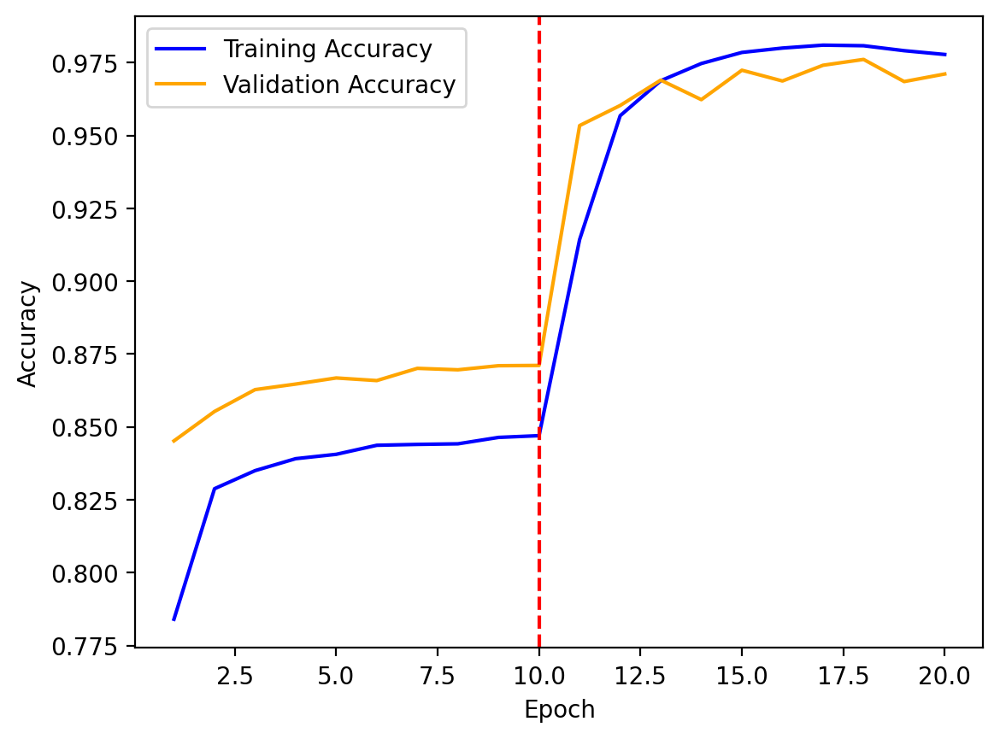

In [ ]:
# Visualize loss history
plt.plot(epoch_count, accuracy, color='blue')
plt.plot(epoch_count, val_accuracy, color='orange')
plt.axvline(x=len(metrics[0]["accuracy"]), color='r', linestyle='--')
plt.legend(['Training Accuracy', 'Validation Accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show();

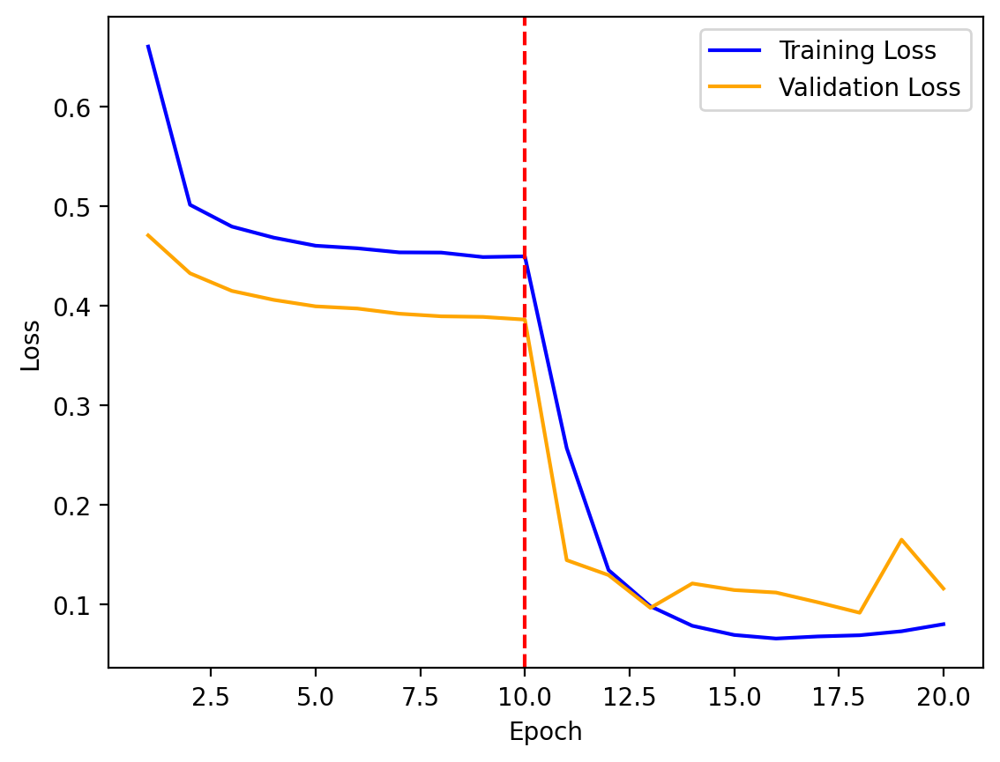

In [ ]:
# Visualize loss history
plt.plot(epoch_count, loss, color='blue')
plt.plot(epoch_count, val_loss, color='orange')
plt.axvline(x=len(metrics[0]["accuracy"]), color='r', linestyle='--')
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show();

## Accuracy, precision, recall, F1, ROC AUC table

In [ ]:
accuracy = accuracy_score(true_categories, predicted_categories)
precision_micro = precision_score(true_categories, predicted_categories, average='macro')
recall_micro = recall_score(true_categories, predicted_categories, average='macro')
f1_micro = f1_score(true_categories, predicted_categories, average='macro')

micro_roc_auc_ovr = roc_auc_score(true_categories, y_pred, multi_class="ovr", average="macro")


pd.DataFrame({
    'Accuracy': [f"{accuracy:.4f}"],
    'Precision': [f"{precision_micro:.4f}"],
    'Recall': [f"{recall_micro:.4f}"],
    'F1 Score': [f"{f1_micro:.4f}"],
    'ROC AUC': [f"{micro_roc_auc_ovr:.4f}"],
})

,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,0.9293,0.9343,0.9288,0.9301,0.9957


## Confusion matrix

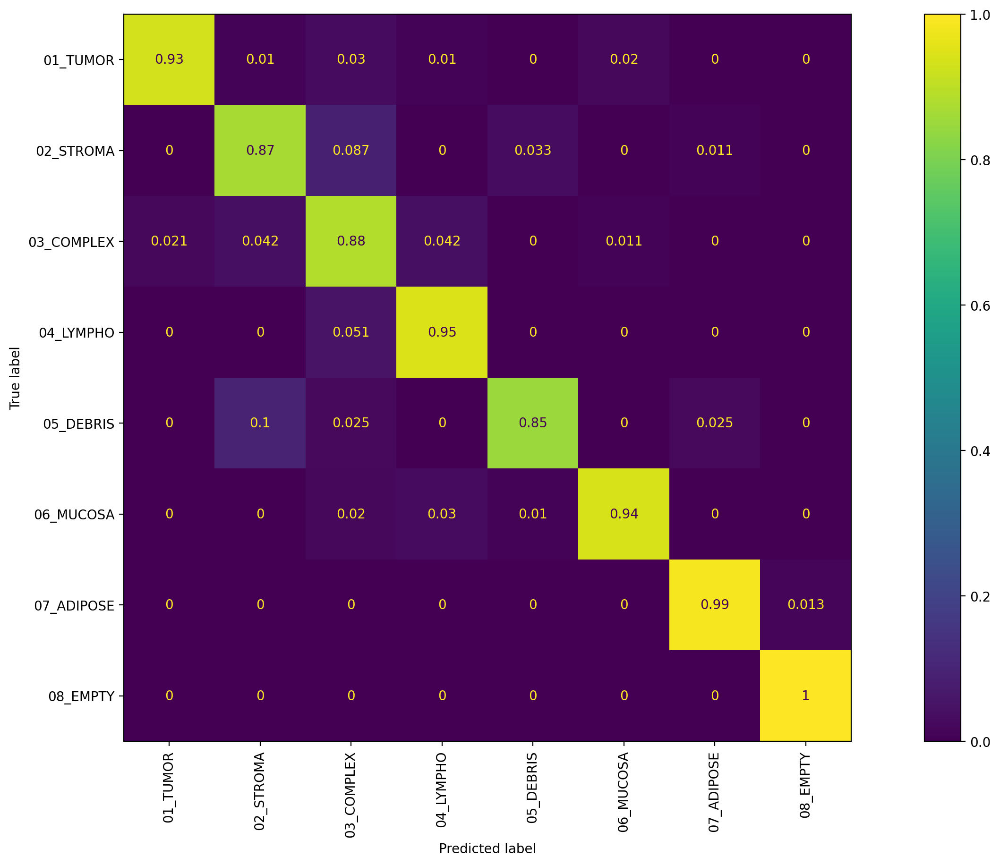

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
ConfusionMatrixDisplay.from_predictions(true_categories, predicted_categories, display_labels=class_names, xticks_rotation="vertical", normalize='true', ax=ax)
plt.show()

In [ ]:
confusion_matrix = multilabel_confusion_matrix(true_categories, predicted_categories)

In [ ]:
confusion_matrix.shape

(8, 2, 2)

In [ ]:
average_precision= 0

# Iterate through each class
for i in range(len(confusion_matrix)):
    # Extract TP, FP, FN
    TN = confusion_matrix[i][0][0]
    FP = confusion_matrix[i][0][1]
    FN = confusion_matrix[i][1][0]
    TP = confusion_matrix[i][1][1]

    average_precision += TP/(TP+FN)

    # Print TP, FP, FN for the current class
    print(f"Class {i}:")
    print(f"True Positives (TP): {TP}")
    print(f"False Positives (FP): {FP}")
    print(f"False Negatives (FN): {FN}")
    print()

print()
print()
print(f"average_precision: {average_precision/len(confusion_matrix):.4f}")

Class 0:
True Positives (TP): 93
False Positives (FP): 2
False Negatives (FN): 7

Class 1:
True Positives (TP): 80
False Positives (FP): 13
False Negatives (FN): 12

Class 2:
True Positives (TP): 84
False Positives (FP): 20
False Negatives (FN): 11

Class 3:
True Positives (TP): 93
False Positives (FP): 8
False Negatives (FN): 5

Class 4:
True Positives (TP): 68
False Positives (FP): 4
False Negatives (FN): 12

Class 5:
True Positives (TP): 94
False Positives (FP): 3
False Negatives (FN): 6

Class 6:
True Positives (TP): 76
False Positives (FP): 3
False Negatives (FN): 1

Class 7:
True Positives (TP): 94
False Positives (FP): 1
False Negatives (FN): 0



average_precision: 0.9262


In [ ]:
# Total number of instances
total_instances = TP + FP # + FN + TN

# Normalize the values
TP_normalized = TP / total_instances
# TN_normalized = TN / total_instances
FP_normalized = FP / total_instances
FN_normalized = FN / total_instances

print(f"Micro-averaged True Positives (TP) - Normalized: {TP_normalized:.4f}")
# print(f"Micro-averaged True Negatives (TN) - Normalized: {TN_normalized:.4f}")
print(f"Micro-averaged False Positives (FP) - Normalized: {FP_normalized:.4f}")
print(f"Micro-averaged False Negatives (FN) - Normalized: {FN_normalized:.4f}")

Micro-averaged True Positives (TP) - Normalized: 0.9895
Micro-averaged False Positives (FP) - Normalized: 0.0105
Micro-averaged False Negatives (FN) - Normalized: 0.0000


## ROC and AUC

https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html

### OvR ROC curves (all classes)

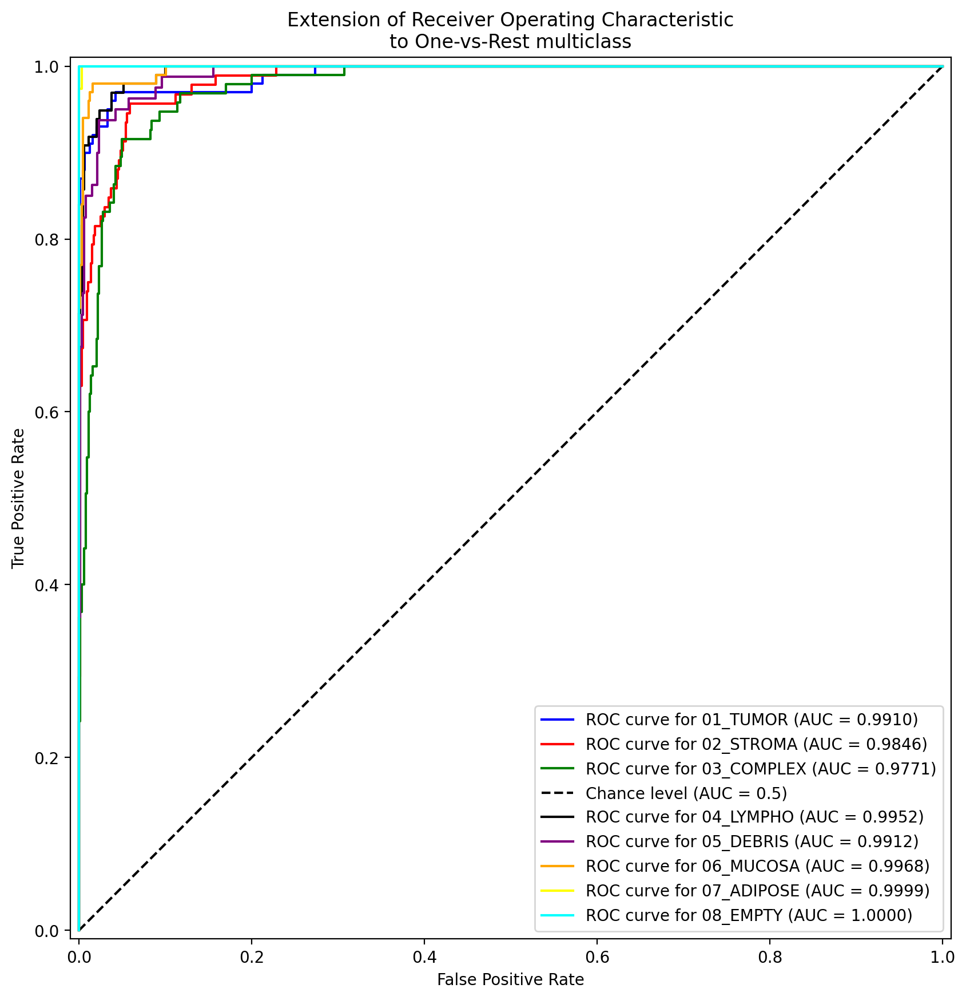

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))


colors = cycle(["blue", "red", "green", "black", "purple", "orange", "yellow", "cyan"])
for class_id, color in zip(range(8), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test[:, class_id],
        y_pred[:, class_id],
        # name=f"ROC curve for {class_names[class_id]} (AUC = {micro_roc_auc_ovr:.4f})",
        label = f'ROC curve for {class_names[class_id]} (AUC = {roc_auc_score(y_onehot_test[:, class_id], y_pred[:, class_id]):.4f})',
        color=color,
        ax=ax,
        plot_chance_level=(class_id == 2),
    )

_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass",
)

### Macro averaged

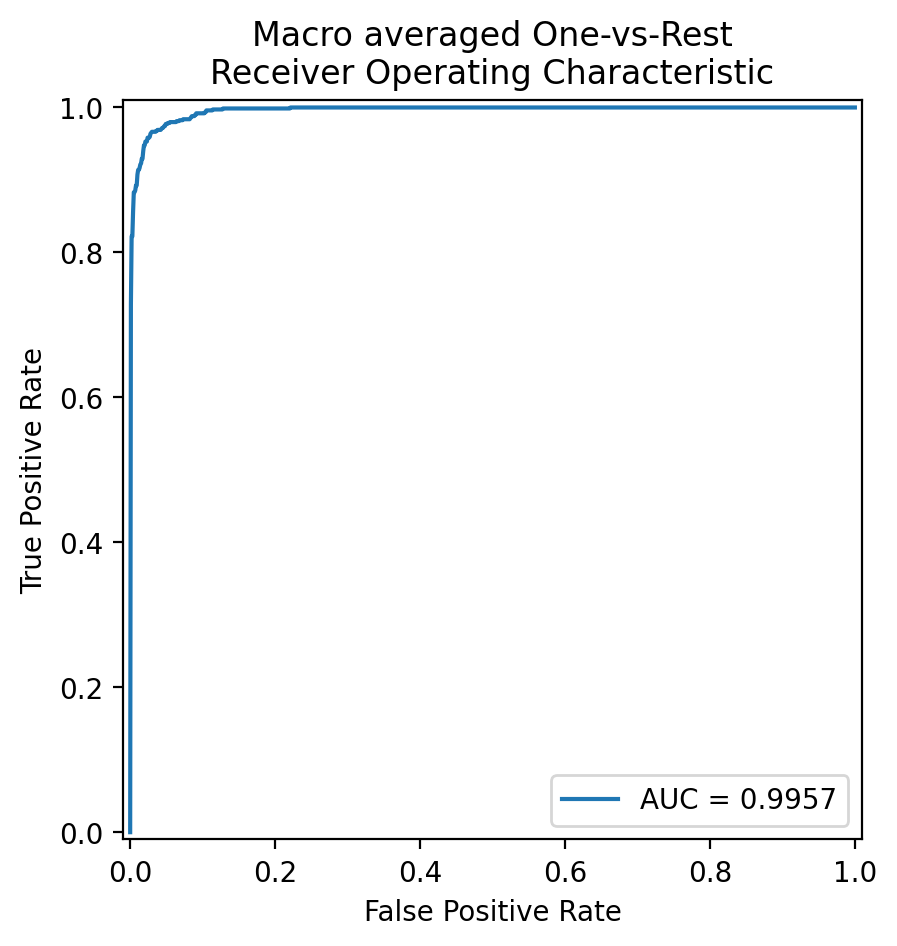

In [ ]:
n_classes = len(class_names)

fpr, tpr, roc_auc = dict(), dict(), dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_onehot_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(n_classes):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])


tpr["macro"][0] = 0 # start from 0 hotfix


display = RocCurveDisplay(fpr=fpr["macro"], tpr=tpr["macro"], estimator_name=f"AUC = {roc_auc['macro']:.4f}")
display.plot()
plt.title("Macro averaged One-vs-Rest\nReceiver Operating Characteristic")
plt.show()

### Micro averaged NOT USED

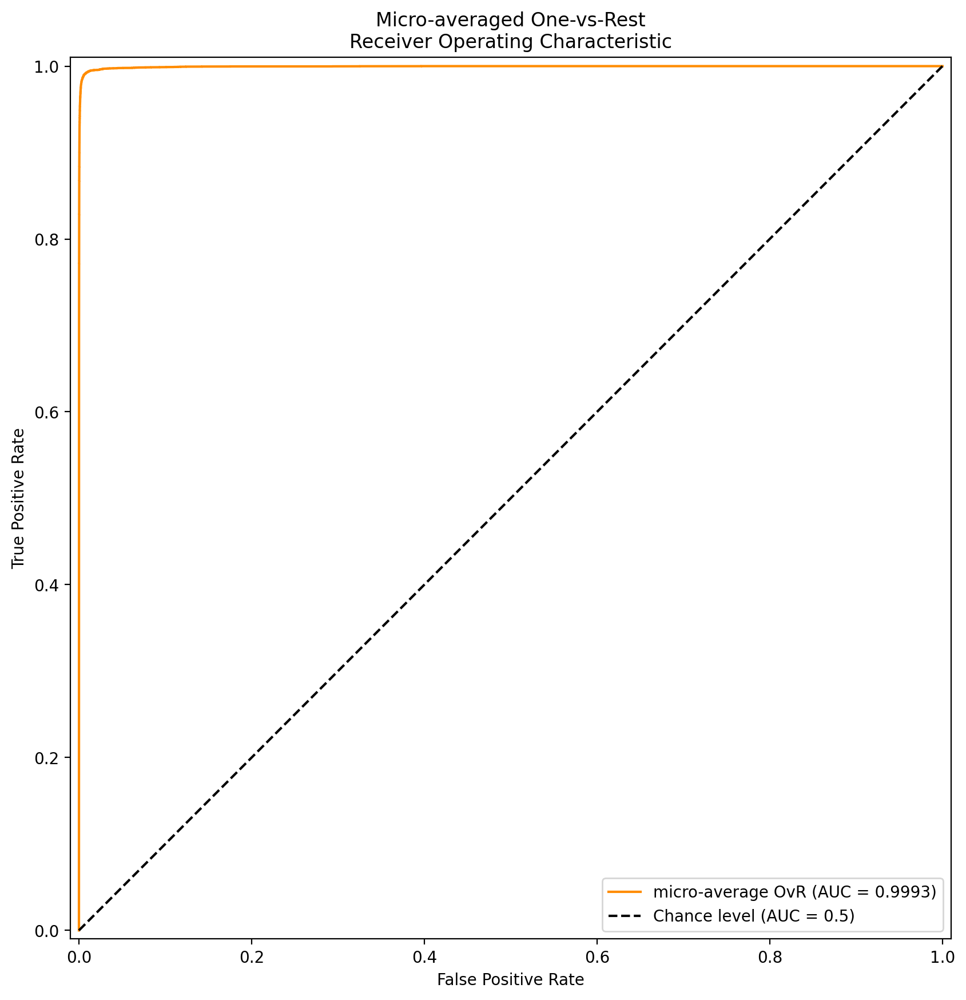

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))

display = RocCurveDisplay.from_predictions(
    y_onehot_test.ravel(),
    y_pred.ravel(),
    name="micro-average OvR",
    color="darkorange",
    plot_chance_level=True,
    ax=ax,  # Pass the ax parameter to the display function
    label = f'micro-average OvR (AUC = {micro_roc_auc_ovr:.4f})'
)
_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Micro-averaged One-vs-Rest\nReceiver Operating Characteristic",
)

plt.show()

## Precision-recall curve

https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html

### Macro averaged

In [ ]:
n_classes = len(class_names)
precision, recall, average_precision_dict = dict(), dict(), dict()

# Calculating precision, recall, and average precision for each class
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_onehot_test[:, i], y_pred[:, i])
    average_precision_dict[i] = average_precision_score(y_onehot_test[:, i], y_pred[:, i])

# Creating a grid for recall values
recall_grid = np.linspace(0.0, 1.0, 1000)

# Interpolating precision values for all classes at these points
mean_precision = np.zeros_like(recall_grid)

for i in range(n_classes):
    # Ensure recall values are sorted in ascending order before interpolation
    sorted_indices = np.argsort(recall[i])
    sorted_recall = recall[i][sorted_indices]
    sorted_precision = precision[i][sorted_indices]

    mean_precision += np.interp(recall_grid, sorted_recall, sorted_precision)  # linear interpolation

mean_precision /= n_classes
average_precision_macro = np.mean(list(average_precision_dict.values()))

# Storing macro-averaged precision-recall curve
recall["macro"] = recall_grid
precision["macro"] = mean_precision
average_precision_dict["macro"] = average_precision_macro

print(f"Macro-averaged One-vs-Rest average_precision score:\n{average_precision_dict['macro']:.6f}")
print(f"{average_precision_score(y_onehot_test, y_pred, average='macro'):.6f}")


Macro-averaged One-vs-Rest average_precision score:
0.975540
0.975540


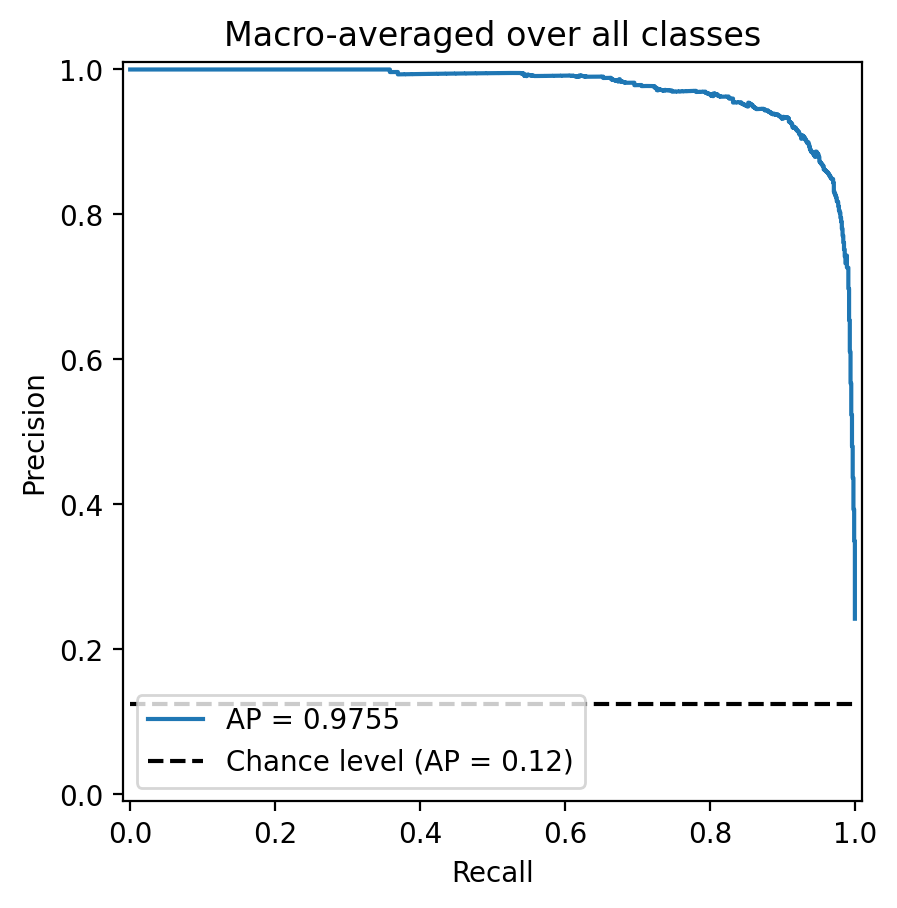

In [ ]:
display = PrecisionRecallDisplay(
    recall=recall['macro'],
    precision=precision['macro'],
    estimator_name=f"AP = {average_precision_dict['macro']:.4f}", # average_precision=average_precision_dict['macro'],
    prevalence_pos_label=Counter(y_onehot_test.ravel())[1] / y_onehot_test.size,
)
display.plot(plot_chance_level=True)
_ = display.ax_.set_title('Macro-averaged over all classes')

### Micro averaged NOT USED

In [ ]:
# For each class
precision = dict()
recall = dict()
average_precision = dict()

# A "micro-average": quantifying score on all classes jointly
precision["micro"], recall["micro"], _ = precision_recall_curve(
    y_onehot_test.ravel(), y_pred.ravel()
)
average_precision["micro"] = average_precision_score(y_onehot_test, y_pred, average="micro")

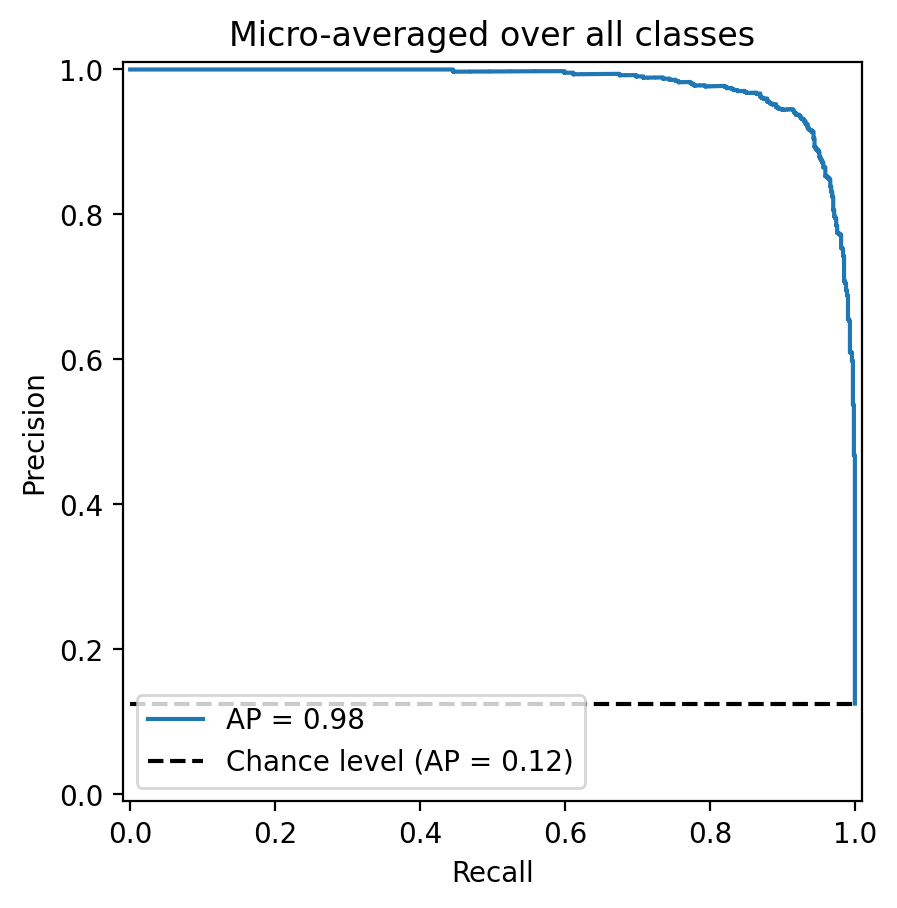

In [ ]:
display = PrecisionRecallDisplay(
    recall=recall["micro"],
    precision=precision["micro"],
    average_precision=average_precision["micro"],
    prevalence_pos_label=Counter(y_onehot_test.ravel())[1] / y_onehot_test.size,
)
display.plot(plot_chance_level=True)
_ = display.ax_.set_title("Micro-averaged over all classes")

## t-SNE

https://danielmuellerkomorowska.com/2021/01/05/introduction-to-t-sne-in-python-with-scikit-learn/

In [ ]:
# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(features)
X_tsne.shape

(736, 2)

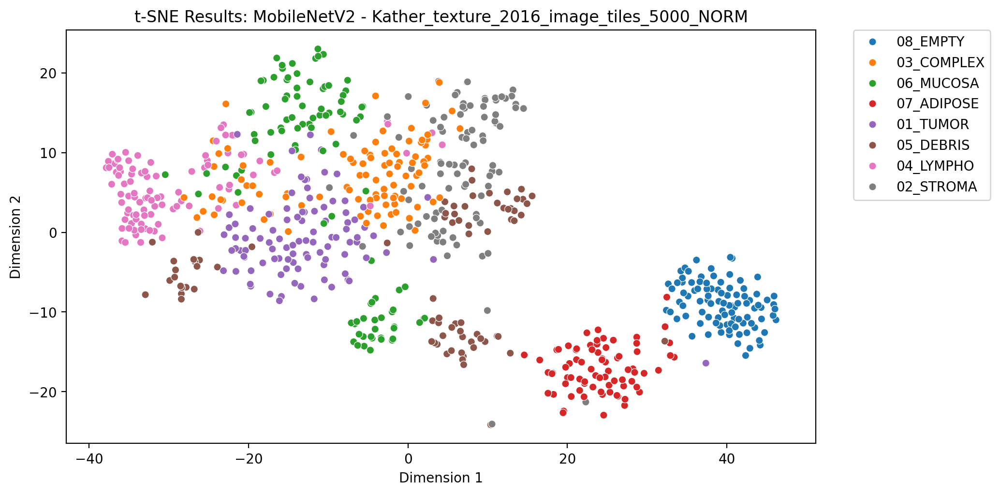

In [ ]:
# Plot the result of our TSNE with the label color coded
# A lot of the stuff here is about making the plot look pretty and not TSNE
tsne_result_df = pd.DataFrame({'tsne_1': X_tsne[:,0], 'tsne_2': X_tsne[:,1], 'label': [class_names[index] for index in true_categories] })
fig, ax = plt.subplots(figsize=(10, 10))
sns.scatterplot(x='tsne_1', y='tsne_2', hue='label', data=tsne_result_df, ax=ax, s=30)
lim = (X_tsne.min()-5, X_tsne.max()+5)
ax.set_xlim(lim)
# ax.set_ylim(lim)
ax.set_aspect('equal')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

ax.set_xlabel('Dimension 1')
ax.set_ylabel('Dimension 2')

ax.set_title(f"t-SNE Results: {model_name} - {os.environ['DATASET']}")

plt.show()


# Extra

In [ ]:
models = ["VGG19", "MobileNetV2", "EfficientNetV2B0"]

datasets = [
    {
        "name": "Colorectal Histology (5000 images)",
        "file_name": "Kather_texture_2016_image_tiles_5000",
        "image_size": (150, 150)
    },
    {
        "name": "NCT-CRC-HE-100K",
        "file_name": "NCT-CRC-HE-100K",
        "image_size": (224, 224)
    },
    {
        "name": "CRC-VAL-HE-7K",
        "file_name": "CRC-VAL-HE-7K",
        "image_size": (224, 224)
    },
    {
        "name": "Merged datasets",
        "file_name": "merged_datasets_k16-NORM",
        "image_size": (100, 100)
    }
]

In [ ]:
test_results = ([
    [
        loadTestResuls(model_name, dataset["file_name"], dataset["image_size"])
        for dataset
        in datasets
    ]
    for model_name
    in models
])

## Big table

In [ ]:
def returnArrayOfMetrics_2(test_results):
  accuracy = accuracy_score(test_results['true_categories'], test_results['predicted_categories'])
  precision_micro = precision_score(test_results['true_categories'], test_results['predicted_categories'], average='macro')
  recall_micro = recall_score(test_results['true_categories'], test_results['predicted_categories'], average='macro')
  f1_micro = f1_score(test_results['true_categories'], test_results['predicted_categories'], average='macro')
  micro_roc_auc_ovr = roc_auc_score(test_results['true_categories'], test_results['y_pred'], multi_class='ovr', average='macro')

  return [accuracy,precision_micro,recall_micro,f1_micro,micro_roc_auc_ovr]


def getDataframeWithDiff_2(datasets, models, test_results):

  df = pd.DataFrame(columns=['Dataset', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'])

  for d,dataset in enumerate(datasets):
    for m,model_name in enumerate(models):
      df.loc[d*len(datasets)+m] = [dataset["name"], model_name] + returnArrayOfMetrics_2(test_results[m][d])

  format_string = '{:.4f}'
  formatted_df = df.applymap(lambda x: format_string.format(x) if isinstance(x, (int, float)) else x)

  return formatted_df

In [ ]:
getDataframeWithDiff_2(datasets, models, test_results)

,Dataset,Model,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,Colorectal Histology (5000 images),VGG19,0.9293,0.9343,0.9288,0.9301,0.9957
1,Colorectal Histology (5000 images),MobileNetV2,0.9266,0.9291,0.9262,0.9270,0.9948
2,Colorectal Histology (5000 images),EfficientNetV2B0,0.9361,0.9384,0.9365,0.9370,0.9968
4,NCT-CRC-HE-100K,VGG19,0.9873,0.9869,0.9873,0.9870,0.9998
5,NCT-CRC-HE-100K,MobileNetV2,0.9895,0.9889,0.9896,0.9893,0.9999
6,NCT-CRC-HE-100K,EfficientNetV2B0,0.9919,0.9917,0.9916,0.9917,0.9999
8,CRC-VAL-HE-7K,VGG19,0.9446,0.9241,0.9295,0.9226,0.9946
9,CRC-VAL-HE-7K,MobileNetV2,0.9503,0.9326,0.9358,0.9330,0.9953
10,CRC-VAL-HE-7K,EfficientNetV2B0,0.9253,0.9030,0.9015,0.8982,0.9919
12,Merged datasets,VGG19,0.9674,0.9688,0.9659,0.9670,0.9988


## ROC and precision-recall curves

In [ ]:
def getROCCurvePoints(test_results):
  n_classes = len(test_results["class_names"])

  fpr, tpr, roc_auc = dict(), dict(), dict()

  for i in range(n_classes):
      fpr[i], tpr[i], _ = roc_curve(test_results["y_onehot_test"][:, i], test_results["y_pred"][:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])

  fpr_grid = np.linspace(0.0, 1.0, 1000)

  # Interpolate all ROC curves at these points
  mean_tpr = np.zeros_like(fpr_grid)

  for i in range(n_classes):
      mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

  # Average it and compute AUC
  mean_tpr /= n_classes

  fpr["macro"] = fpr_grid
  tpr["macro"] = mean_tpr
  roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])


  tpr["macro"][0] = 0 # start from 0 hotfix

  return fpr["macro"], tpr["macro"], roc_auc["macro"]

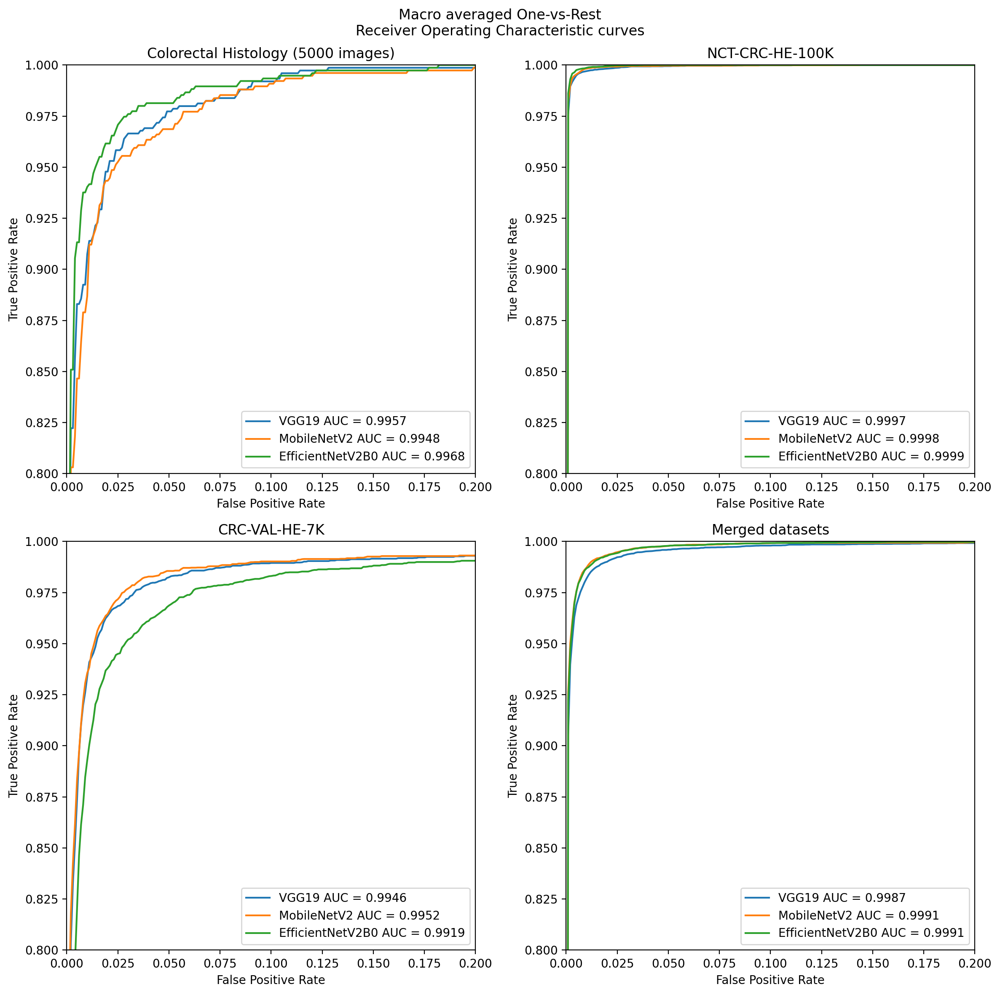

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))




for d, dataset in enumerate(datasets):
    for m, model_name in enumerate(models):
        fpr, tpr, roc_auc = getROCCurvePoints(test_results[m][d])
        display = RocCurveDisplay(fpr=fpr, tpr=tpr, estimator_name=f"{model_name} AUC = {roc_auc:.4f}")
        display.plot(ax=axes[int(d/2), d%2])
        axes[int(d/2), d%2].set_title(f"{dataset['name']}")
        axes[int(d/2), d%2].set_xlabel('False Positive Rate')
        axes[int(d/2), d%2].set_ylabel('True Positive Rate')
        axes[int(d/2), d%2].legend(loc='lower right')
        axes[int(d/2), d%2].set(ylim=(0.8,1), xlim=(0,0.2))

plt.suptitle("Macro averaged One-vs-Rest\nReceiver Operating Characteristic curves")
plt.tight_layout()
plt.show()

In [ ]:
def getPrecisionRecallCurvePoints(test_results):
  n_classes = len(test_results["class_names"])
  precision, recall, average_precision_dict = dict(), dict(), dict()

  # Calculating precision, recall, and average precision for each class
  for i in range(n_classes):
      precision[i], recall[i], _ = precision_recall_curve(test_results["y_onehot_test"][:, i], test_results["y_pred"][:, i])
      average_precision_dict[i] = average_precision_score(test_results["y_onehot_test"][:, i], test_results["y_pred"][:, i])

  # Creating a grid for recall values
  recall_grid = np.linspace(0.0, 1.0, 1000)

  # Interpolating precision values for all classes at these points
  mean_precision = np.zeros_like(recall_grid)

  for i in range(n_classes):
      # Ensure recall values are sorted in ascending order before interpolation
      sorted_indices = np.argsort(recall[i])
      sorted_recall = recall[i][sorted_indices]
      sorted_precision = precision[i][sorted_indices]

      mean_precision += np.interp(recall_grid, sorted_recall, sorted_precision)  # linear interpolation

  mean_precision /= n_classes
  average_precision_macro = np.mean(list(average_precision_dict.values()))



  mean_precision[len(mean_precision)-1] = 0 # start from 0 hotfix

  # Storing macro-averaged precision-recall curve
  recall["macro"] = recall_grid
  precision["macro"] = mean_precision
  average_precision_dict["macro"] = average_precision_macro


  return recall["macro"], precision["macro"], average_precision_dict["macro"]

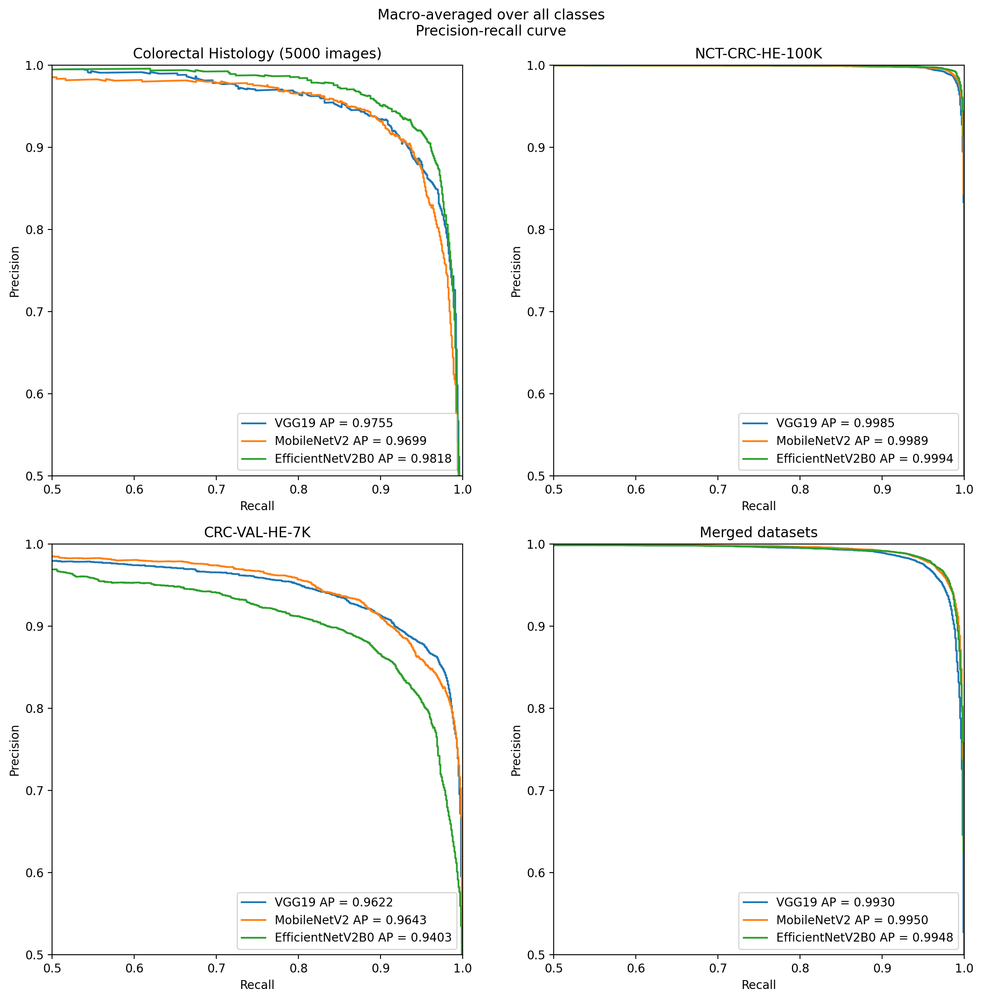

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for d, dataset in enumerate(datasets):
    for m, model_name in enumerate(models):
        recall, precision, average_precision = getPrecisionRecallCurvePoints(test_results[m][d])
        display = PrecisionRecallDisplay(
            recall=recall, precision=precision,
            estimator_name=f"{model_name} AP = {average_precision:.4f}",
            prevalence_pos_label=Counter(test_results[m][d]["y_onehot_test"].ravel())[1] / test_results[m][d]["y_onehot_test"].size
        )

        display.plot(ax=axes[int(d/2), d%2])
        axes[int(d/2), d%2].set_title(f"{dataset['name']}")

        axes[int(d/2), d%2].legend(loc='lower right')
        # axes[d].set_yscale('function', functions=(forward, inverse))
        axes[int(d/2), d%2].set(ylim=(0.5,1), xlim=(0.5,1))

plt.suptitle("Macro-averaged over all classes\nPrecision-recall curve")
plt.tight_layout()
plt.show()

# Extra - normalization effect on k16 and merged

In [ ]:
all_models = ["VGG19", "MobileNetV2", "EfficientNetV2B0"]

In [ ]:
datasets_k16 = ["Kather_texture_2016_image_tiles_5000", "Kather_texture_2016_image_tiles_5000_NORM"]

image_size = 150, 150

test_results_k16 = ([
    [
        loadTestResuls(model_name, dataset,image_size)
        for dataset
        in datasets_k16
    ]
    for model_name
    in all_models
])

In [ ]:
def returnArrayOfMetrics(test_results):
  accuracy = accuracy_score(test_results['true_categories'], test_results['predicted_categories'])
  precision_micro = precision_score(test_results['true_categories'], test_results['predicted_categories'], average='macro')
  recall_micro = recall_score(test_results['true_categories'], test_results['predicted_categories'], average='macro')
  f1_micro = f1_score(test_results['true_categories'], test_results['predicted_categories'], average='macro')
  micro_roc_auc_ovr = roc_auc_score(test_results['true_categories'], test_results['y_pred'], multi_class='ovr', average='macro')

  return [accuracy,precision_micro,recall_micro,f1_micro,micro_roc_auc_ovr]


def getDataframeWithDiff(datasets, test_results):

  df = pd.DataFrame(columns=['Dataset', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'])

  for m,model_name in enumerate(all_models):
    for d,dataset_name in enumerate(datasets):
      df.loc[m*len(all_models)+d] = [dataset_name, model_name] + returnArrayOfMetrics(test_results[m][d])

    added_rows= df.tail(2)



    numeric_columns = added_rows.select_dtypes(include='number')
    diff_df = numeric_columns.diff().fillna(0)

    diff_df.drop(diff_df.head(1).index,inplace=True)
    diff_df['Dataset'] = 'Difference'
    diff_df['Model'] = model_name

    diff_df = diff_df.loc[(diff_df != 0).any(axis=1)]

    df = pd.concat([df, diff_df], axis=0, ignore_index=True)

  format_string = '{:.4f}'
  formatted_df = df.applymap(lambda x: format_string.format(x) if isinstance(x, (int, float)) else x)

  return formatted_df

In [ ]:
getDataframeWithDiff(datasets_k16, test_results_k16)

,Dataset,Model,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,Kather_texture_2016_image_tiles_5000,VGG19,0.9293,0.9343,0.9288,0.9301,0.9957
1,Kather_texture_2016_image_tiles_5000_NORM,VGG19,0.9117,0.9190,0.9134,0.9143,0.9926
2,Difference,VGG19,-0.0177,-0.0153,-0.0155,-0.0158,-0.0031
3,Kather_texture_2016_image_tiles_5000,MobileNetV2,0.9266,0.9291,0.9262,0.9270,0.9948
4,Kather_texture_2016_image_tiles_5000_NORM,MobileNetV2,0.9022,0.9068,0.9005,0.9012,0.9920
5,Difference,MobileNetV2,-0.0245,-0.0223,-0.0258,-0.0258,-0.0028
6,Kather_texture_2016_image_tiles_5000,EfficientNetV2B0,0.9361,0.9384,0.9365,0.9370,0.9968
7,Kather_texture_2016_image_tiles_5000_NORM,EfficientNetV2B0,0.9253,0.9272,0.9264,0.9259,0.9936
8,Difference,EfficientNetV2B0,-0.0109,-0.0113,-0.0101,-0.0112,-0.0032


In [ ]:
model_name = "MobileNetV2"
test_results = test_results_k16[all_models.index(model_name)]

In [ ]:
confusion_matrix_diff = (
    confusion_matrix(test_results[1]["true_categories"], test_results[1]["predicted_categories"])
    - confusion_matrix(test_results[0]["true_categories"], test_results[0]["predicted_categories"])
)

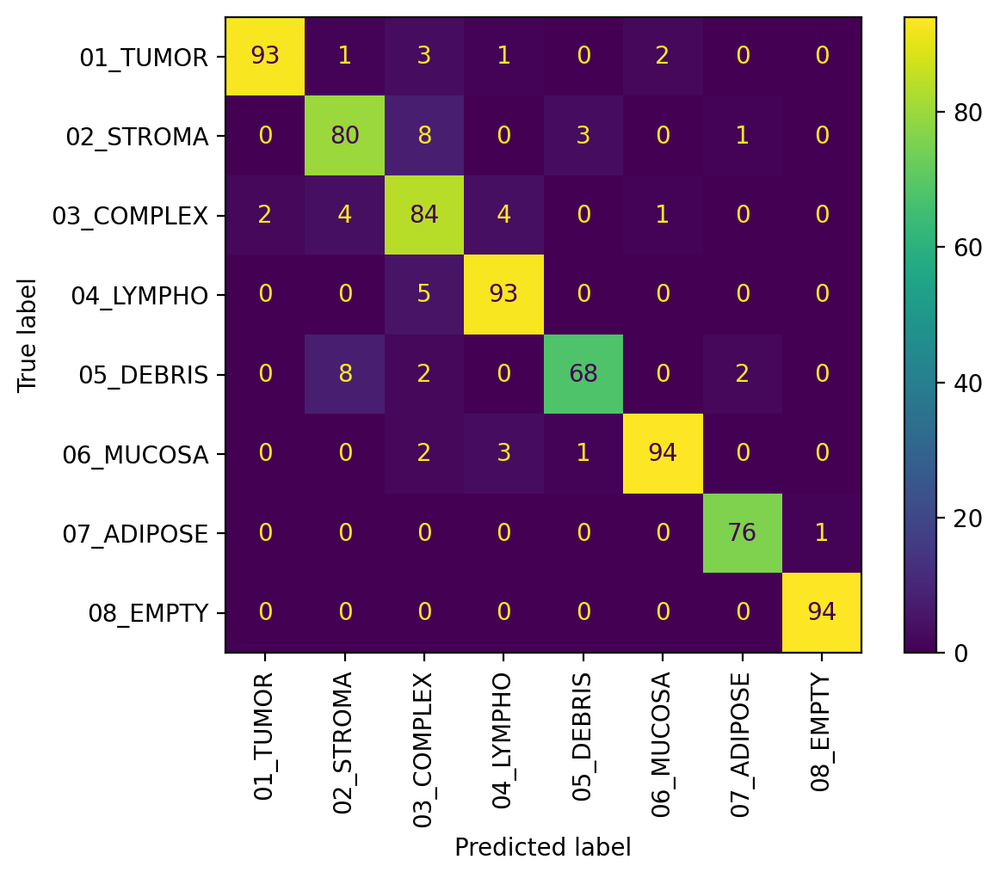

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(test_results[0]["true_categories"], test_results[0]["predicted_categories"]), display_labels=test_results[0]["class_names"])
disp.plot(xticks_rotation="vertical")

plt.show()

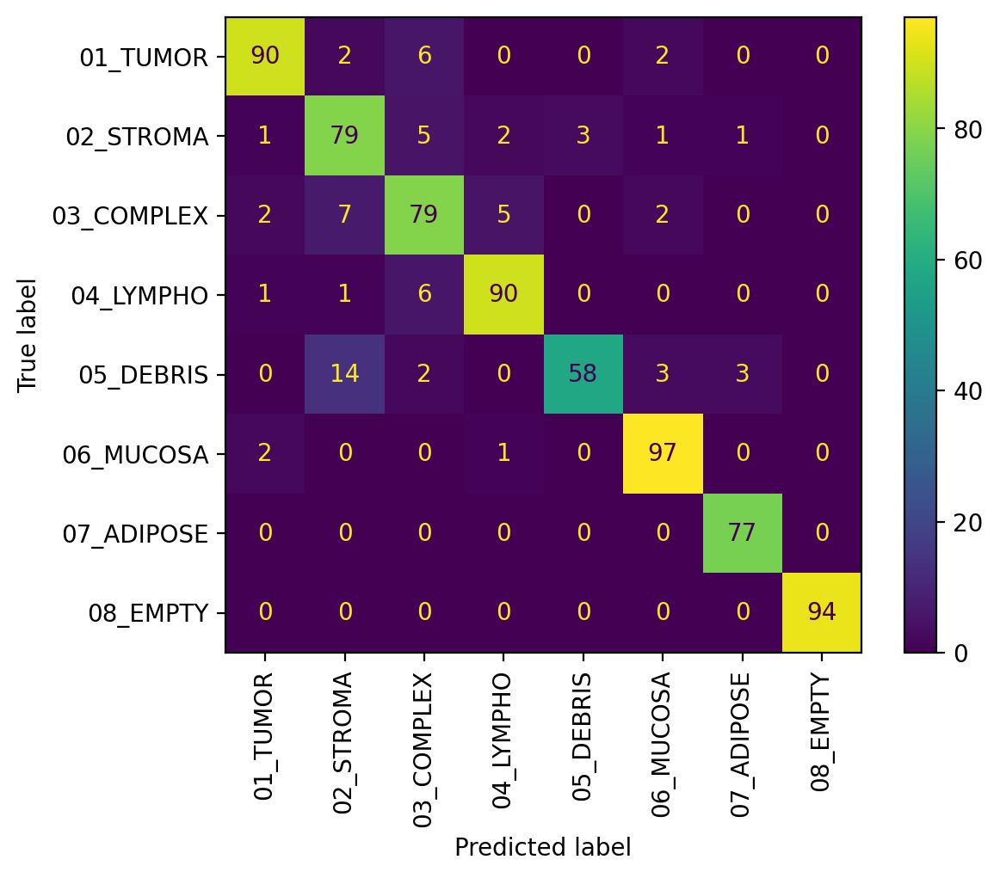

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(test_results[1]["true_categories"], test_results[1]["predicted_categories"]), display_labels=test_results[0]["class_names"])
disp.plot(xticks_rotation="vertical")

plt.show()

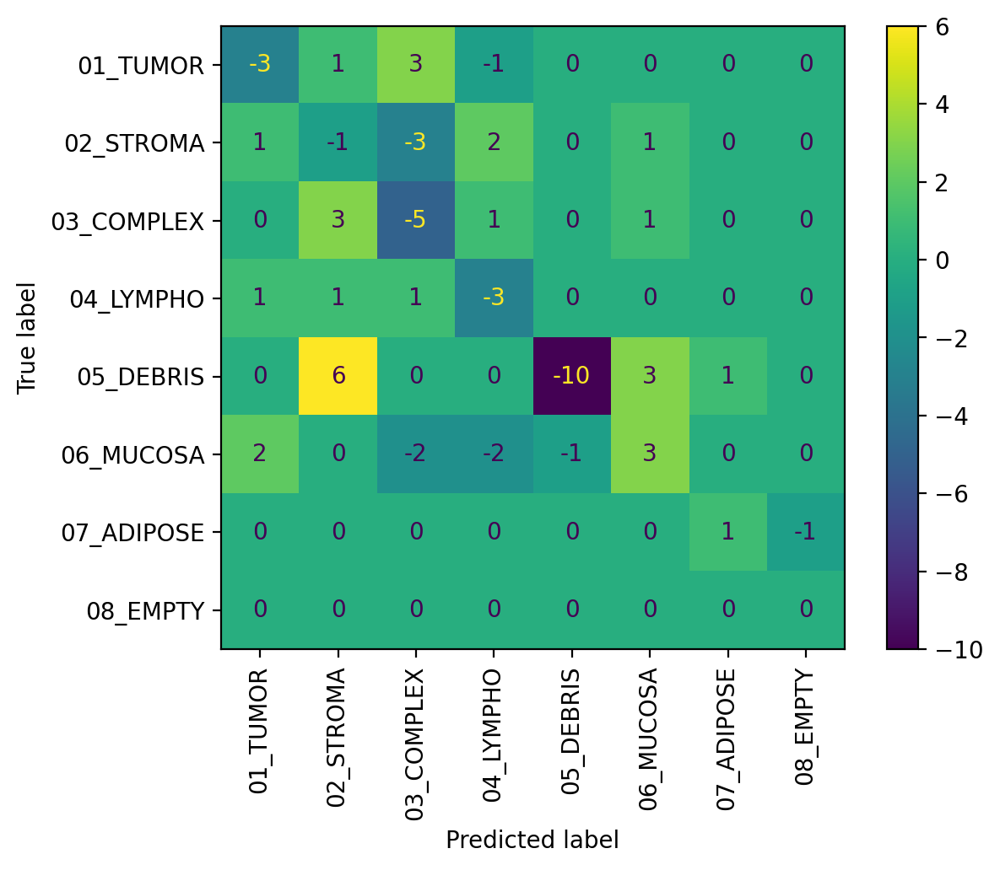

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_diff, display_labels=test_results[0]["class_names"])
disp.plot(xticks_rotation="vertical")

plt.show()

In [ ]:
datasets_merged = ["merged_datasets_k16-NONORM", "merged_datasets_k16-NORM"]

image_size = 100, 100

In [ ]:
test_results_merged = ([
    [
        loadTestResuls(model_name, dataset,image_size)
        for dataset
        in datasets_merged
    ]
    for model_name
    in all_models
])

In [ ]:
getDataframeWithDiff(datasets_merged, test_results_merged)

,Dataset,Model,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,merged_datasets_k16-NONORM,VGG19,0.9795,0.9793,0.9799,0.9795,0.9993
1,merged_datasets_k16-NORM,VGG19,0.9674,0.9688,0.9659,0.9670,0.9988
2,Difference,VGG19,-0.0121,-0.0105,-0.0140,-0.0125,-0.0005
3,merged_datasets_k16-NONORM,MobileNetV2,0.9769,0.9772,0.9764,0.9767,0.9993
4,merged_datasets_k16-NORM,MobileNetV2,0.9707,0.9725,0.9690,0.9704,0.9992
5,Difference,MobileNetV2,-0.0062,-0.0047,-0.0074,-0.0064,-0.0001
6,merged_datasets_k16-NONORM,EfficientNetV2B0,0.9770,0.9777,0.9769,0.9772,0.9994
7,merged_datasets_k16-NORM,EfficientNetV2B0,0.9736,0.9737,0.9740,0.9737,0.9992
8,Difference,EfficientNetV2B0,-0.0034,-0.0040,-0.0029,-0.0035,-0.0002


In [ ]:
model_name = "MobileNetV2"
test_results = test_results_merged[all_models.index(model_name)]

In [ ]:
confusion_matrix_diff = (
    confusion_matrix(test_results[1]["true_categories"], test_results[1]["predicted_categories"])
    - confusion_matrix(test_results[0]["true_categories"], test_results[0]["predicted_categories"])
)

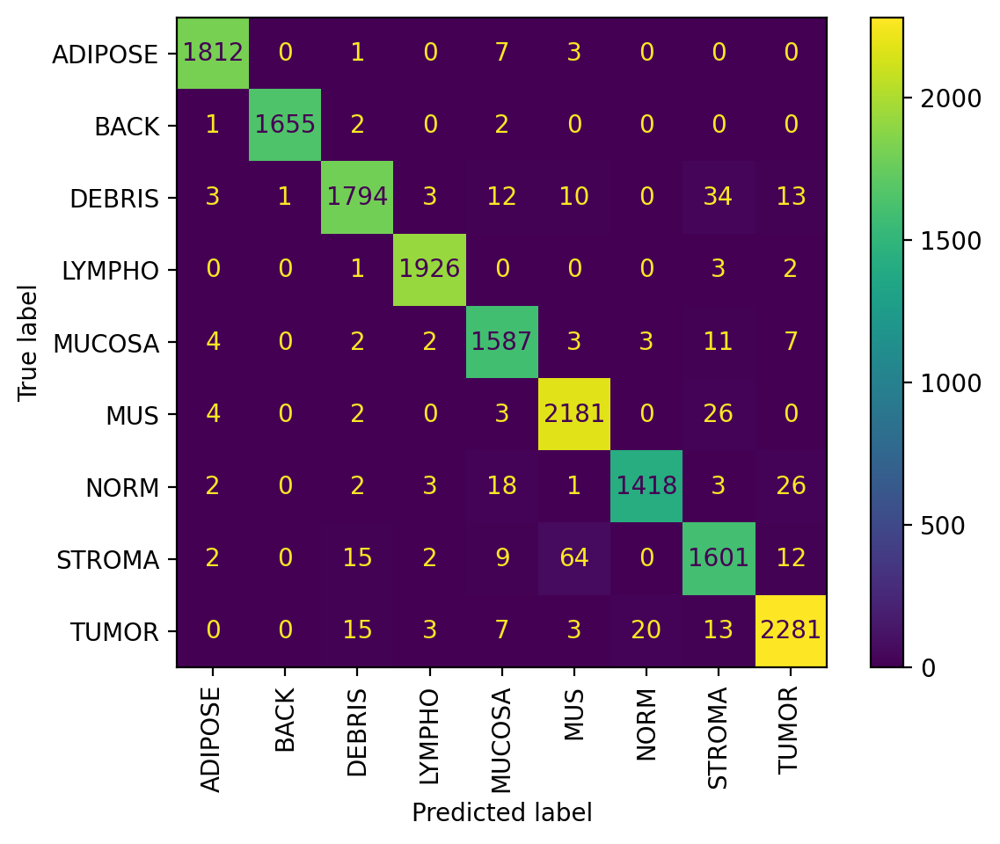

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(test_results[0]["true_categories"], test_results[0]["predicted_categories"]), display_labels=test_results[0]["class_names"])
disp.plot(xticks_rotation="vertical")

plt.show()

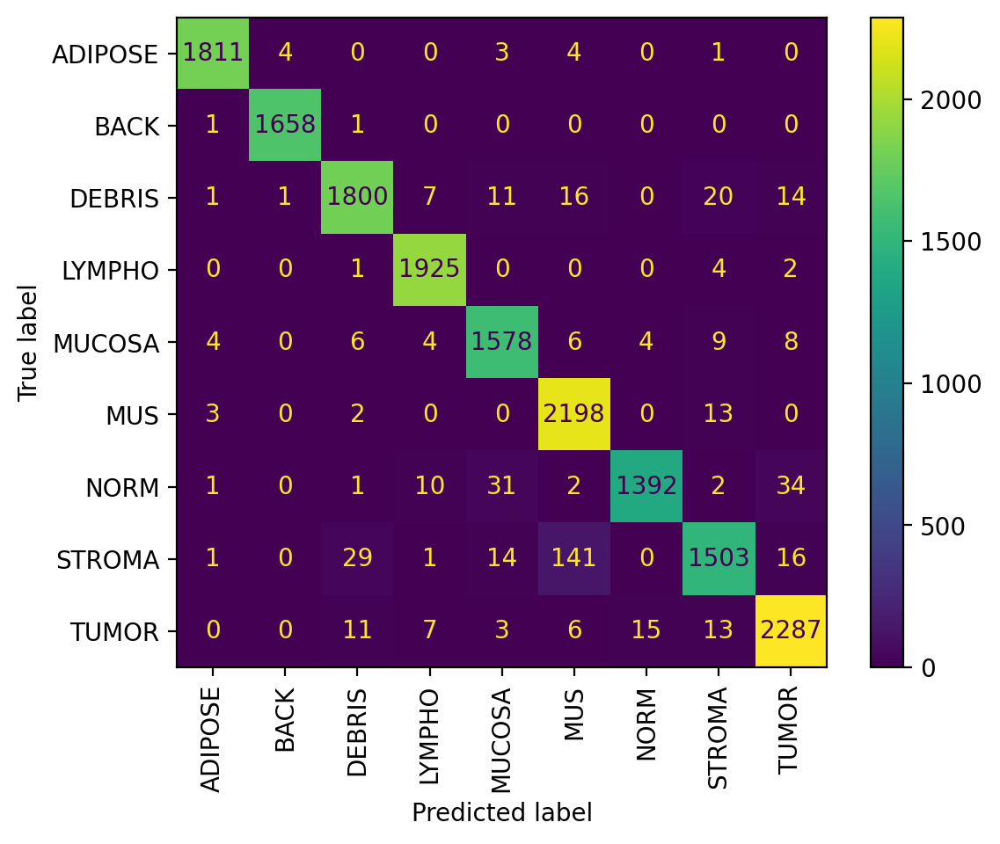

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(test_results[1]["true_categories"], test_results[1]["predicted_categories"]), display_labels=test_results[0]["class_names"])
disp.plot(xticks_rotation="vertical")

plt.show()

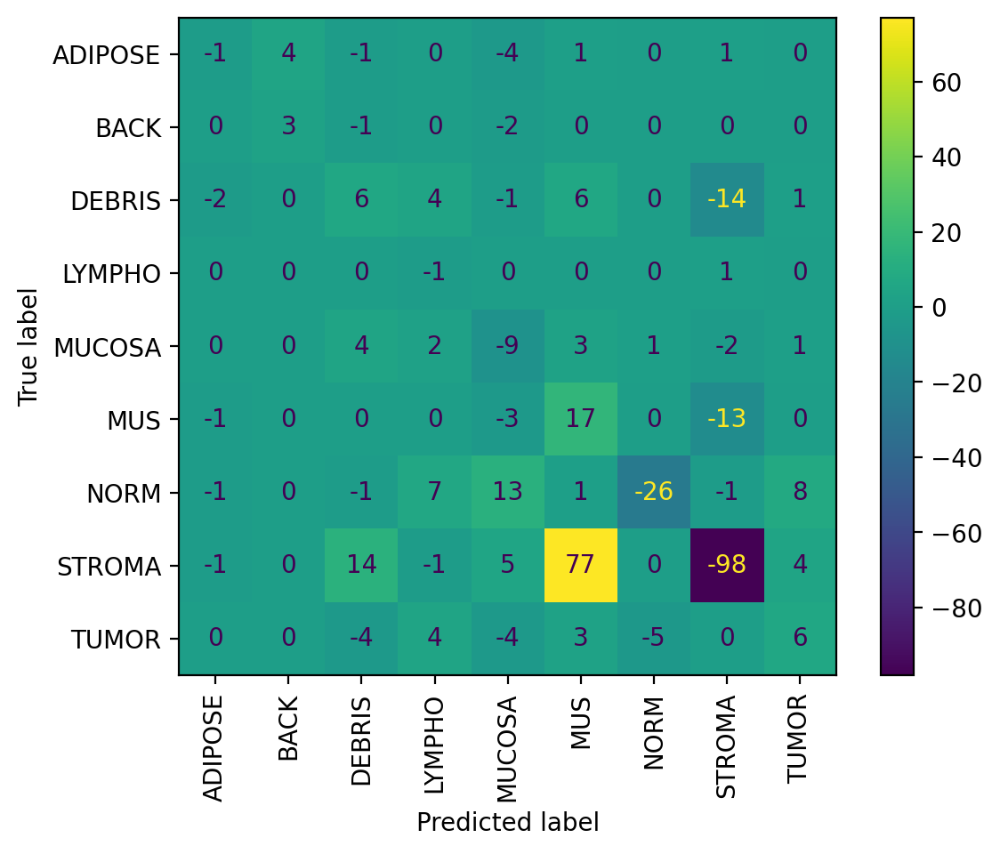

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_diff, display_labels=test_results[0]["class_names"])
disp.plot(xticks_rotation="vertical")

plt.show()

## Extra - how many invalid classification k16 vs k19

In [ ]:
def loadDatasetFilePaths(dataset):
  filename=f"{os.environ['DRIVE_DATA_DIR']}/test_results/dataset_file-paths-{dataset}.pkl"
  image_file_paths = None
  with open(filename, 'rb') as file:
    image_file_paths = pickle.load(file)


  return image_file_paths

image_file_paths = ([
        loadDatasetFilePaths(dataset)
        for dataset
        in datasets_merged
])

Test if each file == prediction with same index (testing offset)

Find all indexes where prediction was wrong.

In [ ]:
# file_paths = image_file_paths[:validation_ds.cardinality().numpy() * batch_size]
file_paths = image_file_paths[0][:520 * batch_size] # 16640

true_categories = test_results[0]['true_categories']
class_names = test_results[0]['class_names']

# Extract the part where MUS, LYMPHO, etc., are written
categories = [path.split('/')[2] for path in file_paths]

differing_indexes = [i for i in range(len(true_categories)) if class_names[true_categories[i]] != categories[i]]

print("Error, offset wrong" if len(differing_indexes) != 0 else "Offset OK")

Offset OK


In [ ]:
import re

def getRatios(differing_indexes):
  selected_file_locations = [file_paths[i] for i in differing_indexes]

  k16_total = sum(1 for item in file_paths if re.search(r'.*\.tif_Row_.*', item))
  k19_total = sum(1 for item in file_paths if not re.search(r'.*\.tif_Row_.*', item))

  k16_wrong = sum(1 for item in selected_file_locations if re.search(r'.*\.tif_Row_.*', item))
  k19_wrong = sum(1 for item in selected_file_locations if not re.search(r'.*\.tif_Row_.*', item))

  print("k16:", k16_wrong, "/", k16_total, " = ", k16_wrong/k16_total)
  print("k19:", k19_wrong, "/", k19_total, " = ", k19_wrong/k19_total)
  print((k16_wrong/k16_total)/(k19_wrong/k19_total))


differing_indexes = [
    [
        i
        for i in range(len(test_results[dataset_id]["true_categories"]))
        if test_results[dataset_id]["true_categories"][i]
        != test_results[dataset_id]["predicted_categories"][i]
    ]
    for dataset_id in range(len(datasets_merged))
]


for id,dataset in enumerate(datasets_merged):
  print(dataset)
  print("Indexes where values differ:", differing_indexes[id][:10])
  print("len:", len(differing_indexes[id]))
  getRatios(differing_indexes[id])
  print()

merged_datasets_k16-NONORM
Indexes where values differ: [35, 71, 103, 105, 183, 206, 217, 229, 273, 288]
len: 385
k16: 40 / 584  =  0.0684931506849315
k19: 345 / 16056  =  0.021487294469357248
3.187611673615247

merged_datasets_k16-NORM
Indexes where values differ: [35, 103, 105, 183, 206, 217, 224, 229, 273, 288]
len: 488
k16: 62 / 584  =  0.10616438356164383
k19: 426 / 16056  =  0.026532137518684603
4.0013505691684355



# Extra - Graf za sve modele i datasetove - training accuracy 3x3

In [ ]:
models = ["VGG19", "MobileNetV2", "EfficientNetV2B0"]
datasets = {
                "files": ["Kather_texture_2016_image_tiles_5000", "NCT-CRC-HE-100K", "merged_datasets_k16-NORM"],
                "names": ["Colorectal Histology (5000 images)", "NCT-CRC-HE-100K", "Merged datasets"],
                "image_size":[(150, 150),(224, 224),(100, 100)]
            }

In [ ]:
accuracy_list = np.empty(shape=[3, 3, 20])
val_accuracy_list = np.empty(shape=[3, 3, 20])
loss_list = np.empty(shape=[3, 3, 20])
val_loss_list = np.empty(shape=[3, 3, 20])
epoch_count_list = np.empty(shape=[3, 3, 20])

In [ ]:
for i, model in enumerate(models):
  for j, dataset in enumerate(datasets["files"]):

    with open(f"{os.environ['DRIVE_DATA_DIR']}/training_results/{dataset}/{model}-{dataset}-{os.environ['IMAGE_FORMAT']}-{datasets['image_size'][j][0]}x{datasets['image_size'][j][1]}-{batch_size}-{phase1optimizer}+{phase2optimizer}-70:15:15.pkl", 'rb') as file:
        metrics, seed = pickle.load(file)

        accuracy_list[i, j] = ([ x for metric in metrics for x in metric["accuracy"]])
        val_accuracy_list[i, j] = ([ x for metric in metrics for x in metric["val_accuracy"]])
        loss_list[i, j] = ([ x for metric in metrics for x in metric["loss"]])
        val_loss_list[i, j] = ([ x for metric in metrics for x in metric["val_loss"]])
        # Create count of the number of epochs
        epoch_count_list[i, j] = (range(1, len(accuracy_list[i, j]) + 1))

In [ ]:
colors = [["blue", "green"], ["orange", "purple"], ["cyan", "magenta"]]

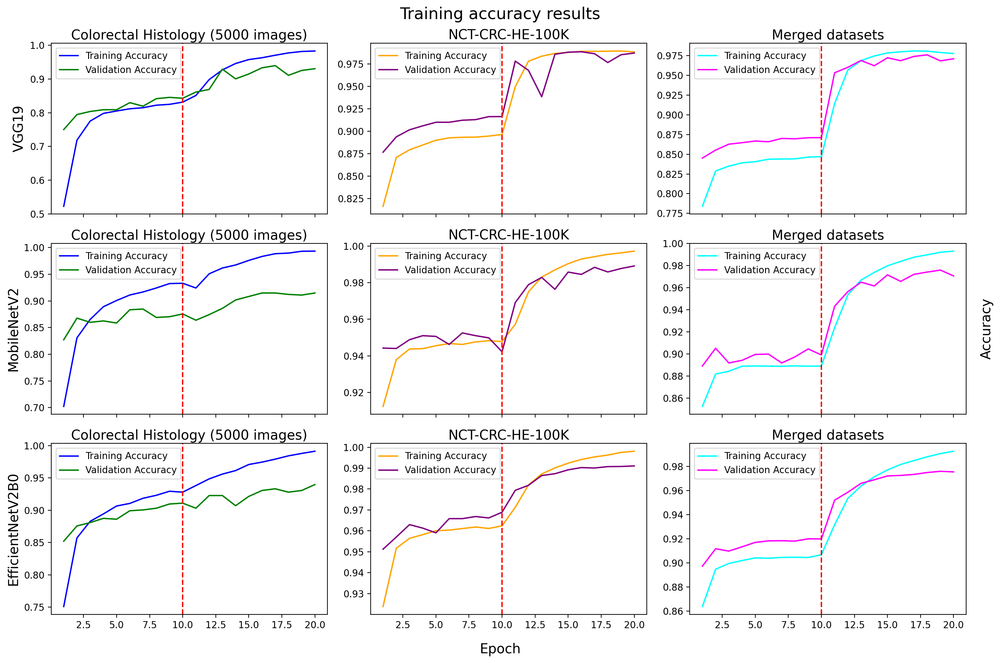

In [ ]:
# https://stackoverflow.com/a/75359081/12108610

fig, axs = plt.subplots(3, 3, figsize=(15, 10),sharex=True)


ax = fig.add_subplot(1, 1, 1)
ax.set_xticks([])
ax.set_yticks([])
[ax.spines[side].set_visible(False) for side in ('left', 'top', 'right', 'bottom')]
ax.patch.set_visible(False)
ax.yaxis.set_label_position('right')
ax.set_ylabel('Accuracy', labelpad=15, fontsize="x-large")

for i, model in enumerate(models):
  for j, dataset in enumerate(datasets["names"]):

    # Visualize loss history
    axs[i, j].plot(epoch_count_list[i, j], accuracy_list[i, j], color=colors[j][0])
    axs[i, j].plot(epoch_count_list[i, j], val_accuracy_list[i, j], color=colors[j][1])
    axs[i, j].axvline(x=len(metrics[0]["accuracy"]), color='r', linestyle='--')
    axs[i, j].legend(['Training Accuracy', 'Validation Accuracy'])

    axs[i, j].set_xlabel(dataset, fontsize="x-large")

    if j == 0:
      axs[i, j].set_ylabel(model, fontsize="x-large")

    axs[i, j].xaxis.set_label_position('top')
    # axs[i, j].yaxis.set_label_position('right')

    # axs[i, j].label_outer()

fig.supxlabel('Epoch', fontsize="x-large")
fig.suptitle(f'Training accuracy results', fontsize="xx-large")
fig.tight_layout()
plt.show()

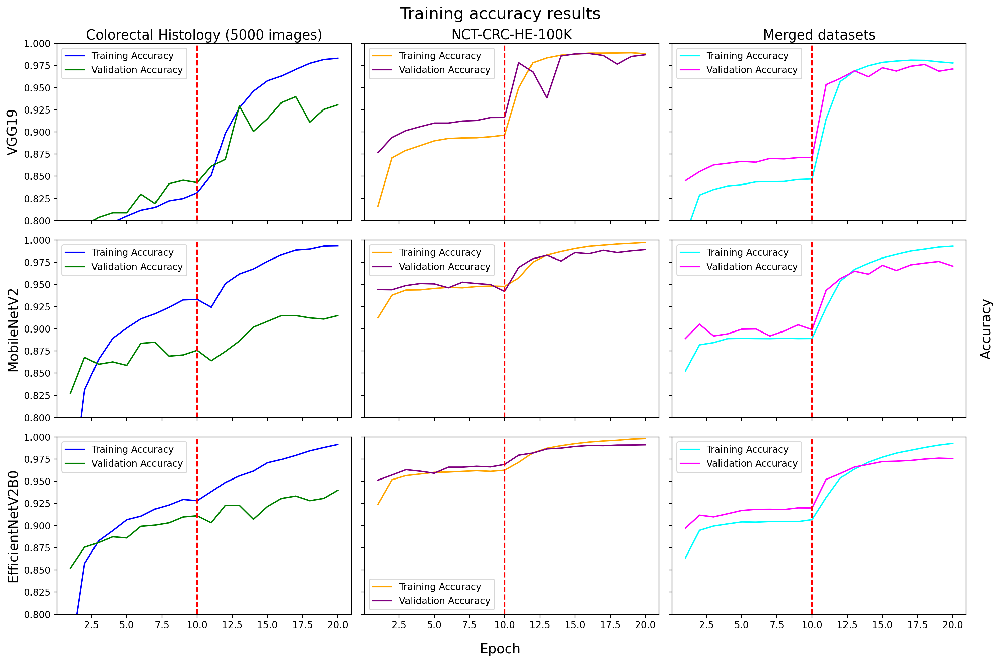

In [ ]:
# https://stackoverflow.com/a/75359081/12108610

fig, axs = plt.subplots(3, 3, figsize=(15, 10),sharex=True, sharey=True)

plt.ylim(0.8,1)

ax = fig.add_subplot(1, 1, 1)
ax.set_xticks([])
ax.set_yticks([])
[ax.spines[side].set_visible(False) for side in ('left', 'top', 'right', 'bottom')]
ax.patch.set_visible(False)
ax.yaxis.set_label_position('right')
ax.set_ylabel('Accuracy', labelpad=15, fontsize="x-large")

for i, model in enumerate(models):
  for j, dataset in enumerate(datasets["names"]):

    # Visualize loss history
    axs[i, j].plot(epoch_count_list[i, j], accuracy_list[i, j], color=colors[j][0])
    axs[i, j].plot(epoch_count_list[i, j], val_accuracy_list[i, j], color=colors[j][1])
    axs[i, j].axvline(x=len(metrics[0]["accuracy"]), color='r', linestyle='--')
    axs[i, j].legend(['Training Accuracy', 'Validation Accuracy'])

    axs[i, j].set_xlabel(dataset, fontsize="x-large")
    axs[i, j].set_ylabel(model, fontsize="x-large")

    axs[i, j].xaxis.set_label_position('top')
    # axs[i, j].yaxis.set_label_position('right')

    axs[i, j].label_outer()

fig.supxlabel('Epoch', fontsize="x-large")
fig.suptitle(f'Training accuracy results', fontsize="xx-large")
fig.tight_layout()
plt.show()